# PROJECT 3

Course: From Shallow To Deep Learning 

Author: Nicolas Arrieta Larraza

Date: 17-02-2021

## Introduction

In this project we will be  working with the The German Traffic Sign Recognition Benchmark (GTSRB) dataset focused on **traffic sign recognition**. The dataset is already preprocessed since the **images are cropped and centered** around the traffic signs, however the dataset still offer two main challenges for us:


1.   The low resolution of the images with **poor contrast**
2.   The dataset is **heavily unbalanced**



## Initializing

### Importing libraries

In [ ]:
%matplotlib inline
import os
import glob
import numpy as np
import time
import pandas as pd
import copy
import seaborn as sns
import torch
import torch.optim as optim
import torch.nn as nn
from matplotlib import pyplot as plt
from google.colab import drive
from google.colab.patches import cv2_imshow
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms, models
from torch.autograd import Variable
from tqdm.notebook import tqdm
from PIL import Image
from collections import Counter

from __future__ import print_function
#%matplotlib inline
import argparse
import random
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torchvision.datasets as dset
import torchvision.utils as vutils
import matplotlib.animation as animation
from IPython.display import HTML

### Connecting to Drive

In [ ]:
drive.mount('/content/drive') 

Mounted at /content/drive


In [ ]:
train_files = "/content/drive/MyDrive/UCA/FS2DL/Dataset_project_3/Final_Training/Images"
test_files = "/content/drive/MyDrive/UCA/FS2DL/Dataset_project_3/Final_Test/Images"

# First task: Data Augmentation

## Data preparation

First I am going to import the training data in a DataFrame to manage easily the dataset

In [ ]:
full_training_df = pd.DataFrame(columns=['id','target'])
for folder in os.listdir(train_files):
  for file in os.listdir(train_files+"/"+folder):
    if file.endswith("csv"):
      info_df = pd.read_csv(train_files+"/"+folder+"/"+file, sep=";")
      class_df = info_df[["Filename", "ClassId"]]
      class_df.columns = ["id", "target"]
      class_df["id"] = folder+"/"+class_df["id"]
      full_training_df = full_training_df.append(class_df, ignore_index=True)

full_training_df.head()
print("Image dataset size of full dataset:", len(full_training_df))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


Image dataset size of full dataset: 39209


Reducing the training set a 50% to compute faster

In [ ]:
training_df, un_used_training_data = np.split(full_training_df.sample(frac=1, random_state=42), [int(.5*len(full_training_df))])
print("Image dataset size to be used:", len(training_df))

Image dataset size to be used: 19604


Then I shuffle the data and divide the training dataset in two:
* training dataset (80%) 
* validation dataset (20%)

In [ ]:
training_df, validation_df = np.split(training_df.sample(frac=1, random_state=42), [int(.8*len(training_df))])
training_df = training_df.reset_index(drop=True)
validation_df = validation_df.reset_index(drop=True)
print("Training dataset size:",len(training_df))
print("Validation dataset size:",len(validation_df))

Training dataset size: 15683
Validation dataset size: 3921


Lastly, I import the test dataset as a DataFrame too

In [ ]:
test_df = pd.DataFrame()
for file in os.listdir(test_files):
    if file.endswith(".test.csv"): 
      info_df = pd.read_csv(test_files+"/"+file, sep=";")
      t_df = info_df["Filename"]
      t_df.head()
      test_df = test_df.append(t_df, ignore_index=True)
      break

test_df = test_df.T
test_df.columns = ['id']
print("Test dataset size:",len(test_df))

Test dataset size: 12630


## Dataset definition

Definition of Pytorch Dataset

In [ ]:
class GTSRB_Dataset(Dataset):

    def __init__(self, img_dir, dataframe, transform=None):
        self.labels_frame = dataframe
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.labels_frame)
        
    def __getitem__(self, idx):
        img_name = os.path.join(self.img_dir, self.labels_frame.id[idx])
        image = Image.open(img_name)
        label = self.labels_frame.target[idx]
        
        if self.transform:
            image = self.transform(image)
          
        return [image, label] 

Let's create a normal dataset without tranformations to access the data efficiently

In [ ]:
normal_ds = GTSRB_Dataset(train_files, training_df)

## Functions

### Plotting functions

In [ ]:
def plot_image_distribution(dataframe):
  count_df = dataframe['target'].value_counts().to_frame()
  count_df['id'] = count_df.index
  count_df.rename(columns={'target':'count'}, inplace=True)

  dims = (22, 10)
  fig, ax = plt.subplots(figsize=dims)

  # seaborn histogram
  sns.barplot(data=count_df, x='id', y='count', ax=ax)
  sns.color_palette("pastel")
  # Add labels
  plt.title('Distribution of images per class',fontweight='bold', fontsize=16)
  plt.xlabel('Class',fontweight='bold', fontsize=12)
  plt.xticks(rotation=90)
  plt.ylabel('Number of images', fontweight='bold', fontsize=12)

In [ ]:
def image_size_distribution():
  X = []
  for i in range(len(normal_ds)):
    sample = normal_ds[i][0]
    X.append(sample)

  heights = [img.shape[0] for img in X]
  widths = [img.shape[1] for img in X]

  sns.set(style="whitegrid")
  plt.figure(figsize=(16, 6))
  plt.title("Size Distribution")
  plt.xlabel("Width")
  plt.ylabel("Height")
  sns.scatterplot(x=widths, y=heights)
  sns.set(style="white");

In [ ]:
def plot_distrib_in_n_batches(batches=5):
  df = pd.DataFrame()
  labels = []

  for i in tqdm(range(batches)):
    img, label = next(iter(train_loader))
    for i in range(31):
      labels.append(label[i].item())

  df["count"] = labels

  count_df = df["count"].value_counts().to_frame()
  count_df['id'] = count_df.index

  dims = (22, 10)
  fig, ax = plt.subplots(figsize=dims)

  # seaborn histogram
  sns.barplot(data=count_df, x='id', y='count', ax=ax)
  sns.color_palette("pastel")
  # Add labels
  plt.title('Distribution of images per class',fontweight='bold', fontsize=16)
  plt.xlabel('Class',fontweight='bold', fontsize=12)
  plt.xticks(rotation=90)
  plt.ylabel('Number of images', fontweight='bold', fontsize=12)

In [ ]:
def display_tensor(t):
  trans = transforms.ToPILImage()
  display(trans(t))

### Helper functions

In [ ]:
def get_weights(dataframe, num_classes):
    #Counting number of images per class                        
    count = [0] * num_classes                                                      
    for idx, row in dataframe.iterrows():     
      count[row['target']] += 1

    #Computing weight of each class
    weight_per_class = [0] * num_classes                                      
    N = float(sum(count))                                                   
    for i in range(num_classes):                                                   
      weight_per_class[i] = N/float(count[i])

    #Assigning weight to each image                                     
    weight = [0] * len(dataframe)                                   
    for idx, row in dataframe.iterrows():    
      weight[idx] = weight_per_class[row['target']]


    return weight

In [ ]:
def set_parameter_requires_grad(model, feature_extracting):
    if feature_extracting:
        for param in model.parameters():
            param.requires_grad = False

In [ ]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

### Training functions

In [ ]:
def train_model(model, dataloaders, datatsets, criterion, optimizer, num_epochs=25):
    since = time.time()

    val_acc_history = []

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0
    all_epoch_loss, all_epoch_acc, all_epoch_val_loss, all_epoch_val_acc = [], [], [], []


    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    # Get model outputs and calculate loss
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)

                    _, preds = torch.max(outputs, 1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(datasets[phase])
            epoch_acc = running_corrects.double() / len(datasets[phase])

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))

            if phase == 'train':
                all_epoch_loss.append(epoch_loss)
                all_epoch_acc.append(epoch_acc)
            else:
                all_epoch_val_loss.append(epoch_loss)
                all_epoch_val_acc.append(epoch_acc)

            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
            if phase == 'val':
                val_acc_history.append(epoch_acc)

        print()

    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    #Plotting accuracy/loss curves
    x = np.arange(num_epochs)
    plt.figure()
    plt.plot(x, all_epoch_acc, label="training")
    plt.plot(x, all_epoch_val_acc, label="validation")
    plt.title('Accuracy curve',fontweight='bold', fontsize=12)
    plt.legend()

    plt.figure()
    plt.plot(x, all_epoch_loss, label="training")
    plt.plot(x, all_epoch_val_loss, label="validation")
    plt.title('Loss curve',fontweight='bold', fontsize=12)
    plt.legend()

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, val_acc_history

In [ ]:
def train_GAN(dataloader):

  # Lists to keep track of progress
  img_list = []
  images_list = []
  G_losses = []
  D_losses = []
  iters = 0

  print("Starting Training Loop...")
  # For each epoch
  for epoch in range(num_epochs):
      print('Epoch {}/{}'.format(epoch, num_epochs - 1))
      print('-' * 10)
      # For each batch in the dataloader
      for i, data in tqdm(enumerate(dataloader, 0)):

          ############################
          # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
          ###########################
          ## Train with all-real batch
          netD.zero_grad()
          # Format batch
          real_cpu = data[0].to(device)
          b_size = real_cpu.size(0)
          label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
          # Forward pass real batch through D
          output = netD(real_cpu).view(-1)
          # Calculate loss on all-real batch
          errD_real = criterion(output, label)
          # Calculate gradients for D in backward pass
          errD_real.backward()
          D_x = output.mean().item()

          ## Train with all-fake batch
          # Generate batch of latent vectors
          noise = torch.randn(b_size, nz, 1, 1, device=device)
          # Generate fake image batch with G
          fake = netG(noise)
          label.fill_(fake_label)
          # Classify all fake batch with D
          output = netD(fake.detach()).view(-1)
          # Calculate D's loss on the all-fake batch
          errD_fake = criterion(output, label)
          # Calculate the gradients for this batch
          errD_fake.backward()
          D_G_z1 = output.mean().item()
          # Add the gradients from the all-real and all-fake batches
          errD = errD_real + errD_fake
          # Update D
          optimizerD.step()

          ############################
          # (2) Update G network: maximize log(D(G(z)))
          ###########################
          netG.zero_grad()
          label.fill_(real_label)  # fake labels are real for generator cost
          # Since we just updated D, perform another forward pass of all-fake batch through D
          output = netD(fake).view(-1)
          # Calculate G's loss based on this output
          errG = criterion(output, label)
          # Calculate gradients for G
          errG.backward()
          D_G_z2 = output.mean().item()
          # Update G
          optimizerG.step()

          # Output training stats
          if i % 50 == 0:
              print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                      errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

          # Save Losses for plotting later
          G_losses.append(errG.item())
          D_losses.append(errD.item())

          # Check how the generator is doing by saving G's output on fixed_noise
          if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
              with torch.no_grad():
                  fake = netG(fixed_noise).detach().cpu()

              images_list.append(fake)
              img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

          iters += 1

  return img_list, images_list, G_losses, D_losses

## Data exploration

### Visualizing content of dataset

Let's display 4 images to verify the content of the dataset. We can observe that, as we mentioned before, there are images with poor lighting

<Figure size 432x288 with 0 Axes>

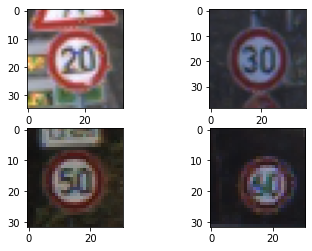

In [ ]:
i=0
images = []
for folder in os.listdir(train_files):
  i+=1
  for file in os.listdir(train_files+"/"+folder):
    if file.endswith(".ppm"): 
      img=Image.open(train_files+"/"+folder+"/"+file)
      images.append(img)
      break
  if i>3:
    break

plt.figure()

f, axarr = plt.subplots(2,2) 

axarr[0][0].imshow(images[0])
axarr[0][1].imshow(images[1])
axarr[1][0].imshow(images[2])
axarr[1][1].imshow(images[3])

### Distribution of images per class


Below we can observe the class histogram (distribution of classes in the dataset). We plot it for both the training and validation set to also show that the split was proportional. The figure show a dataset highly imbalance of classes with more than 800 samples and classes with less than 100

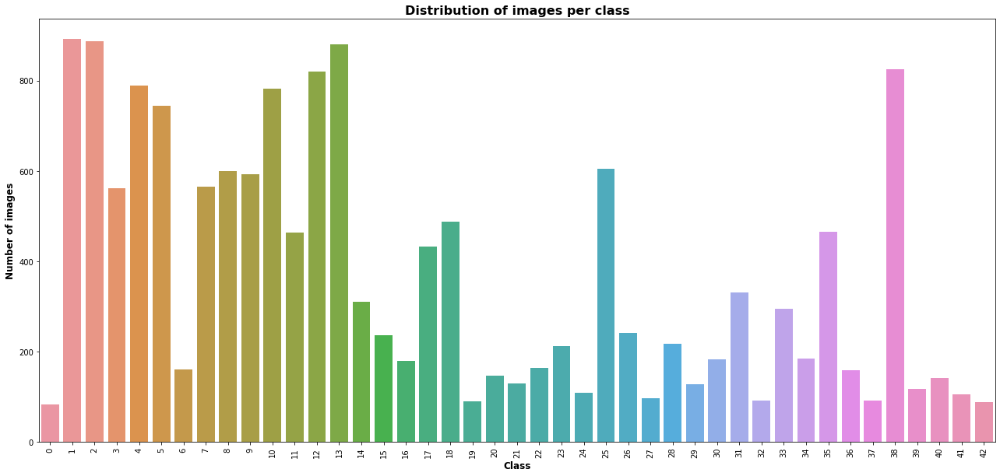

In [ ]:
plot_image_distribution(training_df)

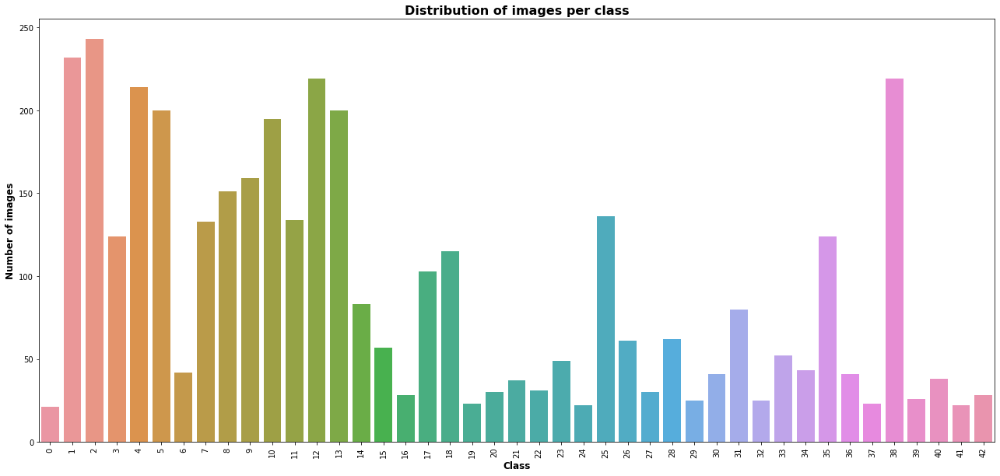

In [ ]:
plot_image_distribution(validation_df)

In [ ]:
count_df = training_df['target'].value_counts().to_frame()
count_df['id'] = count_df.index
count_df.rename(columns={'target':'count'}, inplace=True)
mean = count_df['count'].mean()
print("Mean of number of images per class:", mean)

Mean of number of images per class: 364.72093023255815


As it can be observed, the mean of the number of images per class is less than 370 since most of the classes contain less than 100 images. For a good training dataset we should have around 2000 of images per class.

### Distribution of images per size


In the plot below we can observe the image size distribution of the datatset. As it can be seeen, the majority of samples have small dimensions, although the data have a wide range of sizes, the mean of 50x51

In [ ]:
image_size_distribution()

AttributeError: ignored

## Data pre-processing



### Creating sampler to balance dataset

In order to balance the dataset with transformed data I decided to implement both transformations and a weighted oversampler. By doingthis I will augment the dataset efficiently and in a balance way.

In [ ]:
num_classes = 43
train_weights = get_weights(training_df,num_classes)
train_weights = torch.DoubleTensor(train_weights)
train_sampler = WeightedRandomSampler(train_weights, len(train_weights), replacement = True)

val_weights = get_weights(validation_df,num_classes)
val_weights = torch.DoubleTensor(val_weights)
val_sampler = WeightedRandomSampler(val_weights, len(val_weights), replacement = True)

### Transformers

In order to apply transformations on the images, I create a transformer that applies different augmentations techniques randomly with a probability of 25% each

In [ ]:
augm_transform = transforms.Compose([
        transforms.Resize((224,224)),    
        transforms.RandomHorizontalFlip(p=0.25),
        transforms.RandomPerspective(distortion_scale=0.5, p=0.25), 
        transforms.RandomVerticalFlip(p=0.25),
        transforms.RandomApply(torch.nn.ModuleList([transforms.RandomRotation(degrees=(1, 359)),
                                                    transforms.GaussianBlur(5, sigma=(0.1, 1.0)),
                                                    transforms.RandomResizedCrop((224,224)),]), p=0.25),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             #std=[0.229, 0.224, 0.225])
    ])

### Datasets

Now I build the training and validations custom datasets and apply the transformations on them

In [ ]:
train_ds = GTSRB_Dataset(train_files, training_df, augm_transform)
val_ds = GTSRB_Dataset(train_files, validation_df, augm_transform)

datasets = {"train": train_ds, "val": val_ds}

print("Number of images in training dataset:", len(train_ds))
print("Number of images in validation dataset:", len(val_ds))

Number of images in training dataset: 15683
Number of images in validation dataset: 3921


#### Checking transformations

Now we can see the effect of the transformations for a certain image

Note: The colors of the image are distorted since we applied normalization on it in order to make training faster.

In [ ]:
print("Shape of image is: ", train_ds[7][0].shape)

Shape of image is:  torch.Size([3, 224, 224])


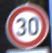

In [ ]:
normal_sample = normal_ds[2][0]
normal_sample

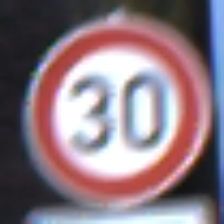

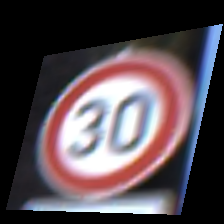

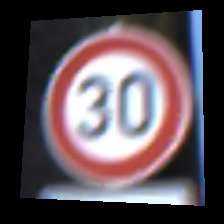

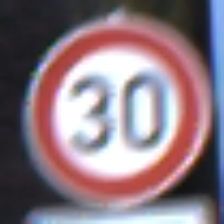

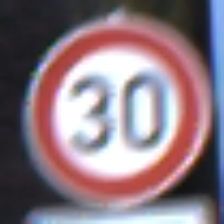

In [ ]:
for i in range(5):
  sample = train_ds[2][0]
  display_tensor(sample)

### Dataloaders

I am going to build dataloaders to feed the model and in them I apply the weighted oversampling mentioned before

In [ ]:
train_loader = DataLoader(datasets["train"], batch_size=16, sampler=train_sampler, num_workers=2)
val_loader = DataLoader(datasets["val"], batch_size=16, sampler=val_sampler, num_workers=2)

dataloaders = {"train": train_loader, "val": val_loader}

#### Checking data distribution after balancing

As we can observe in the figure below, now the dataset is balanced

In [ ]:
plot_distrib_in_n_batches(16)

## Training

First of all I set up the GPU

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-f13d2083-f1f9-4a82-9a51-02f29e2201a6)


### Parameters

These are the parameters chosen to design the model, the number of epochs and batch size have been optimized by running the model several time trying different combinations.

In [ ]:
# Number of classes in the dataset
num_classes = 43

# Batch size for training
batch_size = 16

# Number of epochs to train for
num_epochs = 10

# Flag for feature extracting. When False, we finetune the whole model,
#   when True we only update the reshaped layer params
feature_extract = True

### Model

The model chosen is VGG11. Due to having a small dataset and in order to optimize time, I have picked a pretrained model provided by pytorch. I freezed all the layers and optimized the weights of the last one beofre the output. Also I modified the first and last layers to fit the image size and the number of features

In [ ]:
model_ft = models.vgg11(pretrained=True)
set_parameter_requires_grad(model_ft, feature_extract)
num_ftrs = model_ft.classifier[6].in_features
model_ft.classifier[6] = nn.Linear(num_ftrs,num_classes)
input_size = 224
print(model_ft)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (11): Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): ReLU(inplace=True)
    (13): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (14): ReLU(inplace=True)
    (15): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
 

### Optimizer

I chose a custom optimizerand I design it to only optimize the last layer of my architecture

In [ ]:
# Send the model to GPU
model_ft = model_ft.to(device)

# Gather the parameters to be optimized/updated in this run. If we are
#  finetuning we will be updating all parameters. However, if we are
#  doing feature extract method, we will only update the parameters
#  that we have just initialized, i.e. the parameters with requires_grad
#  is True.
params_to_update = model_ft.parameters()
print("Params to learn:")
if feature_extract:
    params_to_update = []
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            params_to_update.append(param)
            print("\t",name)
else:
    for name,param in model_ft.named_parameters():
        if param.requires_grad == True:
            print("\t",name)

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(params_to_update, lr=0.001, momentum=0.9)

Params to learn:
	 classifier.6.weight
	 classifier.6.bias


### Loss function

I chose a Cross Entropy Loss

In [ ]:
# Setup the loss fxn
criterion = nn.CrossEntropyLoss()

### Training model

Epoch 0/9
----------



train Loss: 2.7208 Acc: 0.2526



val Loss: 2.2152 Acc: 0.3930

Epoch 1/9
----------



train Loss: 2.2433 Acc: 0.3544



val Loss: 1.9607 Acc: 0.4626

Epoch 2/9
----------



train Loss: 2.1379 Acc: 0.3850



val Loss: 1.8660 Acc: 0.4953

Epoch 3/9
----------



train Loss: 2.0841 Acc: 0.3928



val Loss: 1.7979 Acc: 0.5040

Epoch 4/9
----------



train Loss: 2.0093 Acc: 0.4182



val Loss: 1.7362 Acc: 0.5088

Epoch 5/9
----------



train Loss: 1.9823 Acc: 0.4230



val Loss: 1.6825 Acc: 0.5289

Epoch 6/9
----------



train Loss: 1.9529 Acc: 0.4319



val Loss: 1.6708 Acc: 0.5420

Epoch 7/9
----------



train Loss: 1.9216 Acc: 0.4377



val Loss: 1.6292 Acc: 0.5471

Epoch 8/9
----------



train Loss: 1.8967 Acc: 0.4417



val Loss: 1.6027 Acc: 0.5547

Epoch 9/9
----------



train Loss: 1.9053 Acc: 0.4410



val Loss: 1.5923 Acc: 0.5491

Training complete in 18m 45s
Best val Acc: 0.554705


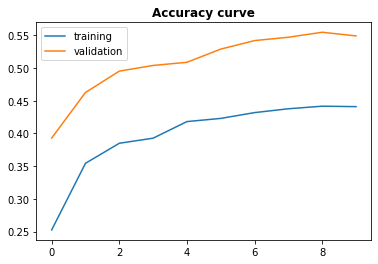

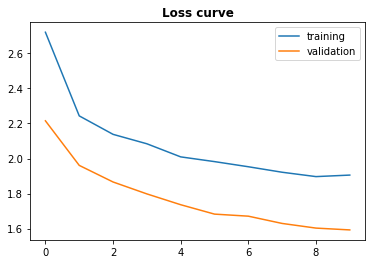

In [ ]:
# Train and evaluate
model_ft, hist = train_model(model_ft, dataloaders, datasets, criterion, optimizer_ft, num_epochs=num_epochs)

# Second task: Data Generation

## Parameters

In [ ]:
# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 35

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

I am going to create a dataset per class that is under-represented in the dataset (less than 500 samples)

## Defining transformer

In [ ]:
resize_transform = transforms.Compose([
        transforms.Resize((64,64)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225])
    ])

## Creating datasets

In [ ]:
count_df = training_df['target'].value_counts().to_frame()
count_df['id'] = count_df.index
count_df.rename(columns={'target':'count'}, inplace=True)

under_represented_df = count_df.loc[count_df['count'] < 500]

class_dataframes = []
for index, row in under_represented_df.iterrows():
    class_df = full_training_df.loc[full_training_df['target'] == index]
    class_df = class_df.reset_index(drop=True)
    class_dataframes.append(class_df)

In [ ]:
class_datasets = []
for df in class_dataframes:
  ds = GTSRB_Dataset(train_files, df, resize_transform)
  class_datasets.append(ds)

## Creating dataloaders

In [ ]:
class_dataloaders = []
for ds in class_datasets:
  dl = DataLoader(ds, batch_size=batch_size, num_workers=2)
  class_dataloaders.append(dl)

## Generator

In [ ]:
# Generator Code

class Generator(nn.Module):
  def __init__(self, ngpu):
      super(Generator, self).__init__()
      self.ngpu = ngpu
      self.main = nn.Sequential(
          # input is Z, going into a convolution
          nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
          nn.BatchNorm2d(ngf * 8),
          nn.ReLU(True),
          # state size. (ngf*8) x 4 x 4
          nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf * 4),
          nn.ReLU(True),
          # state size. (ngf*4) x 8 x 8
          nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf * 2),
          nn.ReLU(True),
          # state size. (ngf*2) x 16 x 16
          nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf),
          nn.ReLU(True),
          # state size. (ngf) x 32 x 32
          nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
          nn.Tanh()
          # state size. (nc) x 64 x 64
      )

  def forward(self, input):
      return self.main(input)

In [ ]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Descriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [ ]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Loss functions and optimizers

In [ ]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## GAN training

In [ ]:
images_list = []
fake_images = []
G_D_loss = []
for dl in class_dataloaders:
  img_list, fake_imgs, G_losses, D_losses = train_GAN(class_dataloaders[0])
  images_list.append(img_list)
  fake_images.append(fake_imgs)
  G_D_loss.append(tuple((G_losses, D_losses)))
  

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0303	Loss_G: 5.5661	D(x): 0.9998	D(G(z)): 0.0289 / 0.0179

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0902	Loss_G: 5.2616	D(x): 0.9929	D(G(z)): 0.0725 / 0.0298

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0131	Loss_G: 5.4236	D(x): 0.9994	D(G(z)): 0.0124 / 0.0084

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.5040	Loss_G: 3.5975	D(x): 0.9999	D(G(z)): 0.2954 / 0.0554

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0295	Loss_G: 5.7040	D(x): 0.9992	D(G(z)): 0.0261 / 0.0154

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0229	Loss_G: 4.7487	D(x): 0.9973	D(G(z)): 0.0196 / 0.0170

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0576	Loss_G: 2.5647	D(x): 1.0000	D(G(z)): 0.0533 / 0.1693

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0234	Loss_G: 4.7878	D(x): 0.9999	D(G(z)): 0.0227 / 0.0129

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0184	Loss_G: 5.0452	D(x): 0.9991	D(G(z)): 0.0171 / 0.0169

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0411	Loss_G: 5.5555	D(x): 0.9735	D(G(z)): 0.0119 / 0.0087

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0213	Loss_G: 5.0439	D(x): 0.9999	D(G(z)): 0.0208 / 0.0106

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0236	Loss_G: 5.7517	D(x): 0.9939	D(G(z)): 0.0167 / 0.0105

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0530	Loss_G: 3.9523	D(x): 0.9960	D(G(z)): 0.0469 / 0.0299

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0223	Loss_G: 5.7066	D(x): 0.9990	D(G(z)): 0.0206 / 0.0136

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0149	Loss_G: 6.0242	D(x): 0.9950	D(G(z)): 0.0096 / 0.0065

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0353	Loss_G: 4.8856	D(x): 0.9921	D(G(z)): 0.0263 / 0.0154

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0156	Loss_G: 5.1902	D(x): 0.9996	D(G(z)): 0.0150 / 0.0093

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0229	Loss_G: 4.8161	D(x): 0.9985	D(G(z)): 0.0209 / 0.0126

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0206	Loss_G: 5.4383	D(x): 0.9980	D(G(z)): 0.0182 / 0.0122

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0307	Loss_G: 4.4635	D(x): 0.9975	D(G(z)): 0.0274 / 0.0168

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0167	Loss_G: 5.6685	D(x): 0.9964	D(G(z)): 0.0127 / 0.0078

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0174	Loss_G: 5.2888	D(x): 0.9991	D(G(z)): 0.0162 / 0.0098

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0149	Loss_G: 5.3004	D(x): 0.9984	D(G(z)): 0.0132 / 0.0081

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0194	Loss_G: 5.7932	D(x): 0.9998	D(G(z)): 0.0186 / 0.0109

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0186	Loss_G: 5.6229	D(x): 0.9990	D(G(z)): 0.0172 / 0.0099

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0236	Loss_G: 4.9940	D(x): 0.9980	D(G(z)): 0.0211 / 0.0126

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0232	Loss_G: 5.0840	D(x): 0.9986	D(G(z)): 0.0212 / 0.0115

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0195	Loss_G: 5.4066	D(x): 0.9983	D(G(z)): 0.0173 / 0.0099

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0241	Loss_G: 5.1239	D(x): 0.9990	D(G(z)): 0.0224 / 0.0142

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0291	Loss_G: 4.5488	D(x): 0.9995	D(G(z)): 0.0279 / 0.0159

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0242	Loss_G: 4.8178	D(x): 0.9996	D(G(z)): 0.0232 / 0.0135

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0300	Loss_G: 4.8482	D(x): 0.9987	D(G(z)): 0.0275 / 0.0173

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0356	Loss_G: 4.6011	D(x): 0.9992	D(G(z)): 0.0336 / 0.0203

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0242	Loss_G: 4.8348	D(x): 0.9986	D(G(z)): 0.0223 / 0.0132

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0181	Loss_G: 5.1511	D(x): 0.9996	D(G(z)): 0.0173 / 0.0099

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0288	Loss_G: 4.6048	D(x): 0.9988	D(G(z)): 0.0268 / 0.0157

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0257	Loss_G: 4.7477	D(x): 0.9997	D(G(z)): 0.0247 / 0.0160

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0285	Loss_G: 5.0732	D(x): 0.9995	D(G(z)): 0.0262 / 0.0154

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0217	Loss_G: 4.8760	D(x): 0.9993	D(G(z)): 0.0205 / 0.0133

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0221	Loss_G: 5.4684	D(x): 0.9987	D(G(z)): 0.0202 / 0.0110

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0258	Loss_G: 5.1291	D(x): 0.9994	D(G(z)): 0.0238 / 0.0123

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0189	Loss_G: 5.2977	D(x): 0.9963	D(G(z)): 0.0148 / 0.0088

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0238	Loss_G: 4.8512	D(x): 0.9993	D(G(z)): 0.0225 / 0.0131

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0278	Loss_G: 5.1882	D(x): 0.9991	D(G(z)): 0.0255 / 0.0146

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0233	Loss_G: 5.0350	D(x): 0.9982	D(G(z)): 0.0208 / 0.0127

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0160	Loss_G: 5.2502	D(x): 0.9993	D(G(z)): 0.0151 / 0.0087

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0126	Loss_G: 5.2882	D(x): 0.9995	D(G(z)): 0.0120 / 0.0076

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0135	Loss_G: 5.7576	D(x): 0.9995	D(G(z)): 0.0127 / 0.0079

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0245	Loss_G: 4.7025	D(x): 0.9984	D(G(z)): 0.0223 / 0.0137

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0164	Loss_G: 5.4183	D(x): 0.9988	D(G(z)): 0.0149 / 0.0096

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0153	Loss_G: 5.3327	D(x): 0.9992	D(G(z)): 0.0143 / 0.0087

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0212	Loss_G: 4.6333	D(x): 0.9958	D(G(z)): 0.0166 / 0.0148

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0160	Loss_G: 5.2438	D(x): 0.9997	D(G(z)): 0.0153 / 0.0097

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0164	Loss_G: 5.1967	D(x): 0.9994	D(G(z)): 0.0155 / 0.0089

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0116	Loss_G: 5.6538	D(x): 0.9990	D(G(z)): 0.0103 / 0.0072

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0156	Loss_G: 5.4693	D(x): 0.9985	D(G(z)): 0.0138 / 0.0080

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0179	Loss_G: 5.4623	D(x): 0.9992	D(G(z)): 0.0167 / 0.0091

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0262	Loss_G: 5.1349	D(x): 0.9991	D(G(z)): 0.0244 / 0.0144

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0323	Loss_G: 4.9579	D(x): 0.9993	D(G(z)): 0.0296 / 0.0159

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0208	Loss_G: 5.0593	D(x): 0.9995	D(G(z)): 0.0198 / 0.0112

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0123	Loss_G: 5.4931	D(x): 0.9995	D(G(z)): 0.0116 / 0.0069

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0209	Loss_G: 5.0449	D(x): 0.9997	D(G(z)): 0.0201 / 0.0122

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0192	Loss_G: 5.0826	D(x): 0.9980	D(G(z)): 0.0169 / 0.0107

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0272	Loss_G: 4.8586	D(x): 0.9942	D(G(z)): 0.0208 / 0.0121

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0222	Loss_G: 5.0008	D(x): 0.9984	D(G(z)): 0.0201 / 0.0110

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0192	Loss_G: 5.5862	D(x): 0.9947	D(G(z)): 0.0135 / 0.0079

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0184	Loss_G: 5.4149	D(x): 0.9997	D(G(z)): 0.0175 / 0.0094

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0454	Loss_G: 4.3684	D(x): 0.9925	D(G(z)): 0.0364 / 0.0183

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0385	Loss_G: 4.4935	D(x): 0.9999	D(G(z)): 0.0365 / 0.0173

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0927	Loss_G: 5.3009	D(x): 0.9630	D(G(z)): 0.0515 / 0.0121

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0155	Loss_G: 6.4323	D(x): 0.9990	D(G(z)): 0.0141 / 0.0059

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0828	Loss_G: 4.1212	D(x): 0.9993	D(G(z)): 0.0762 / 0.0258

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0594	Loss_G: 4.6391	D(x): 0.9926	D(G(z)): 0.0490 / 0.0213

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0392	Loss_G: 4.4909	D(x): 0.9988	D(G(z)): 0.0365 / 0.0186

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0266	Loss_G: 5.0682	D(x): 0.9971	D(G(z)): 0.0228 / 0.0106

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0263	Loss_G: 5.3170	D(x): 0.9990	D(G(z)): 0.0241 / 0.0146

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0375	Loss_G: 5.1262	D(x): 0.9995	D(G(z)): 0.0341 / 0.0155

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0146	Loss_G: 5.2676	D(x): 0.9997	D(G(z)): 0.0141 / 0.0086

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0218	Loss_G: 5.2269	D(x): 0.9997	D(G(z)): 0.0208 / 0.0121

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0104	Loss_G: 5.7862	D(x): 0.9982	D(G(z)): 0.0084 / 0.0051

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0114	Loss_G: 5.7276	D(x): 0.9996	D(G(z)): 0.0108 / 0.0072

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0226	Loss_G: 4.8640	D(x): 0.9981	D(G(z)): 0.0201 / 0.0175

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0204	Loss_G: 4.9528	D(x): 0.9993	D(G(z)): 0.0193 / 0.0112

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0142	Loss_G: 5.1918	D(x): 0.9993	D(G(z)): 0.0132 / 0.0080

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0187	Loss_G: 5.0396	D(x): 0.9974	D(G(z)): 0.0158 / 0.0090

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0241	Loss_G: 4.8027	D(x): 0.9999	D(G(z)): 0.0233 / 0.0144

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0225	Loss_G: 5.1790	D(x): 0.9992	D(G(z)): 0.0210 / 0.0124

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0173	Loss_G: 5.4884	D(x): 0.9972	D(G(z)): 0.0143 / 0.0082

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0394	Loss_G: 4.3089	D(x): 0.9994	D(G(z)): 0.0372 / 0.0220

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0168	Loss_G: 5.0825	D(x): 0.9991	D(G(z)): 0.0156 / 0.0094

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0162	Loss_G: 5.0723	D(x): 0.9992	D(G(z)): 0.0152 / 0.0090

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0231	Loss_G: 4.7428	D(x): 0.9996	D(G(z)): 0.0222 / 0.0127

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0204	Loss_G: 4.9244	D(x): 0.9999	D(G(z)): 0.0198 / 0.0123

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0198	Loss_G: 5.2529	D(x): 0.9997	D(G(z)): 0.0189 / 0.0111

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0153	Loss_G: 5.1478	D(x): 0.9999	D(G(z)): 0.0149 / 0.0091

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0186	Loss_G: 5.0541	D(x): 0.9995	D(G(z)): 0.0176 / 0.0105

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0211	Loss_G: 4.9751	D(x): 0.9987	D(G(z)): 0.0192 / 0.0125

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0147	Loss_G: 5.7269	D(x): 0.9985	D(G(z)): 0.0129 / 0.0072

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0399	Loss_G: 4.8089	D(x): 0.9931	D(G(z)): 0.0306 / 0.0171

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0304	Loss_G: 4.4541	D(x): 0.9998	D(G(z)): 0.0293 / 0.0190

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0201	Loss_G: 5.0064	D(x): 0.9954	D(G(z)): 0.0151 / 0.0109

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0271	Loss_G: 4.5695	D(x): 0.9997	D(G(z)): 0.0259 / 0.0162

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0346	Loss_G: 4.8973	D(x): 0.9997	D(G(z)): 0.0319 / 0.0179

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0373	Loss_G: 4.6979	D(x): 0.9996	D(G(z)): 0.0348 / 0.0169

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0271	Loss_G: 4.8568	D(x): 0.9993	D(G(z)): 0.0254 / 0.0140

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0195	Loss_G: 5.1172	D(x): 0.9994	D(G(z)): 0.0184 / 0.0105

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0289	Loss_G: 4.9499	D(x): 0.9992	D(G(z)): 0.0259 / 0.0136

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0188	Loss_G: 5.0905	D(x): 0.9996	D(G(z)): 0.0179 / 0.0094

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0168	Loss_G: 5.3690	D(x): 0.9994	D(G(z)): 0.0157 / 0.0092

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0207	Loss_G: 5.1480	D(x): 0.9992	D(G(z)): 0.0192 / 0.0101

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0215	Loss_G: 5.1436	D(x): 0.9992	D(G(z)): 0.0198 / 0.0114

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0191	Loss_G: 5.1724	D(x): 0.9977	D(G(z)): 0.0163 / 0.0099

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0161	Loss_G: 5.4355	D(x): 0.9995	D(G(z)): 0.0153 / 0.0094

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0281	Loss_G: 4.7566	D(x): 0.9983	D(G(z)): 0.0255 / 0.0133

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0238	Loss_G: 4.9914	D(x): 0.9991	D(G(z)): 0.0221 / 0.0108

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0374	Loss_G: 4.8832	D(x): 0.9995	D(G(z)): 0.0347 / 0.0175

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0132	Loss_G: 5.2885	D(x): 0.9995	D(G(z)): 0.0125 / 0.0073

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0256	Loss_G: 4.5641	D(x): 0.9999	D(G(z)): 0.0249 / 0.0149

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0232	Loss_G: 5.0230	D(x): 0.9991	D(G(z)): 0.0215 / 0.0117

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0256	Loss_G: 4.7733	D(x): 0.9994	D(G(z)): 0.0243 / 0.0142

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0208	Loss_G: 5.4916	D(x): 0.9992	D(G(z)): 0.0195 / 0.0100

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0197	Loss_G: 4.7533	D(x): 0.9997	D(G(z)): 0.0190 / 0.0124

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0213	Loss_G: 4.8709	D(x): 0.9992	D(G(z)): 0.0201 / 0.0117

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0410	Loss_G: 4.4962	D(x): 0.9997	D(G(z)): 0.0380 / 0.0201

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0331	Loss_G: 4.6147	D(x): 0.9976	D(G(z)): 0.0296 / 0.0171

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0253	Loss_G: 4.8542	D(x): 0.9992	D(G(z)): 0.0229 / 0.0128

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0189	Loss_G: 5.0225	D(x): 0.9992	D(G(z)): 0.0177 / 0.0101

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0232	Loss_G: 4.7619	D(x): 0.9982	D(G(z)): 0.0209 / 0.0129

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0237	Loss_G: 4.8617	D(x): 0.9988	D(G(z)): 0.0217 / 0.0127

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0247	Loss_G: 4.6505	D(x): 0.9991	D(G(z)): 0.0233 / 0.0137

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0178	Loss_G: 5.2331	D(x): 0.9993	D(G(z)): 0.0167 / 0.0103

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0174	Loss_G: 4.9547	D(x): 0.9980	D(G(z)): 0.0152 / 0.0095

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0111	Loss_G: 5.9464	D(x): 0.9989	D(G(z)): 0.0099 / 0.0057

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0299	Loss_G: 4.6910	D(x): 0.9962	D(G(z)): 0.0253 / 0.0160

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0127	Loss_G: 5.5914	D(x): 0.9981	D(G(z)): 0.0106 / 0.0068

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0197	Loss_G: 4.9481	D(x): 0.9995	D(G(z)): 0.0187 / 0.0120

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0182	Loss_G: 5.0878	D(x): 0.9986	D(G(z)): 0.0165 / 0.0096

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0346	Loss_G: 4.4018	D(x): 0.9994	D(G(z)): 0.0327 / 0.0185

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0366	Loss_G: 4.3526	D(x): 0.9998	D(G(z)): 0.0350 / 0.0186

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0263	Loss_G: 4.5096	D(x): 0.9993	D(G(z)): 0.0250 / 0.0159

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0308	Loss_G: 4.7720	D(x): 0.9998	D(G(z)): 0.0291 / 0.0147

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0382	Loss_G: 4.4923	D(x): 0.9989	D(G(z)): 0.0352 / 0.0200

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0261	Loss_G: 4.6400	D(x): 0.9997	D(G(z)): 0.0252 / 0.0143

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0437	Loss_G: 4.1680	D(x): 0.9997	D(G(z)): 0.0414 / 0.0233

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0250	Loss_G: 4.4634	D(x): 0.9997	D(G(z)): 0.0242 / 0.0156

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0312	Loss_G: 4.3671	D(x): 0.9997	D(G(z)): 0.0300 / 0.0174

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0228	Loss_G: 4.7869	D(x): 0.9997	D(G(z)): 0.0220 / 0.0121

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0254	Loss_G: 4.6481	D(x): 0.9997	D(G(z)): 0.0246 / 0.0135

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0254	Loss_G: 5.4995	D(x): 0.9990	D(G(z)): 0.0236 / 0.0130

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0174	Loss_G: 5.7470	D(x): 0.9991	D(G(z)): 0.0161 / 0.0087

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0199	Loss_G: 5.0793	D(x): 0.9975	D(G(z)): 0.0170 / 0.0101

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0197	Loss_G: 4.8935	D(x): 0.9993	D(G(z)): 0.0184 / 0.0121

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0210	Loss_G: 5.0961	D(x): 0.9988	D(G(z)): 0.0195 / 0.0090

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0169	Loss_G: 5.0712	D(x): 0.9979	D(G(z)): 0.0146 / 0.0093

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0353	Loss_G: 5.0780	D(x): 0.9998	D(G(z)): 0.0333 / 0.0154

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0285	Loss_G: 4.6449	D(x): 0.9996	D(G(z)): 0.0271 / 0.0156

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0201	Loss_G: 4.9492	D(x): 0.9997	D(G(z)): 0.0193 / 0.0111

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0426	Loss_G: 4.2223	D(x): 0.9997	D(G(z)): 0.0405 / 0.0199

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0327	Loss_G: 4.4009	D(x): 0.9994	D(G(z)): 0.0309 / 0.0179

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0221	Loss_G: 4.8590	D(x): 0.9994	D(G(z)): 0.0210 / 0.0121

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0248	Loss_G: 4.6726	D(x): 0.9995	D(G(z)): 0.0238 / 0.0135

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0295	Loss_G: 4.5549	D(x): 0.9982	D(G(z)): 0.0269 / 0.0158

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0289	Loss_G: 4.5309	D(x): 0.9994	D(G(z)): 0.0276 / 0.0144

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0197	Loss_G: 5.0065	D(x): 0.9995	D(G(z)): 0.0187 / 0.0104

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0208	Loss_G: 4.9477	D(x): 0.9992	D(G(z)): 0.0196 / 0.0107

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0192	Loss_G: 4.9119	D(x): 0.9995	D(G(z)): 0.0184 / 0.0111

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0215	Loss_G: 4.9051	D(x): 0.9980	D(G(z)): 0.0191 / 0.0107

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0203	Loss_G: 5.0262	D(x): 0.9993	D(G(z)): 0.0192 / 0.0106

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0220	Loss_G: 4.7781	D(x): 0.9994	D(G(z)): 0.0209 / 0.0122

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0413	Loss_G: 4.3655	D(x): 0.9992	D(G(z)): 0.0387 / 0.0207

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0257	Loss_G: 4.5611	D(x): 0.9995	D(G(z)): 0.0246 / 0.0147

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0257	Loss_G: 4.8591	D(x): 0.9993	D(G(z)): 0.0243 / 0.0139

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0286	Loss_G: 4.4949	D(x): 0.9997	D(G(z)): 0.0275 / 0.0158

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0251	Loss_G: 4.7853	D(x): 0.9992	D(G(z)): 0.0235 / 0.0132

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0220	Loss_G: 4.9921	D(x): 0.9998	D(G(z)): 0.0213 / 0.0119

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0209	Loss_G: 4.7289	D(x): 0.9988	D(G(z)): 0.0193 / 0.0127

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0133	Loss_G: 5.0746	D(x): 0.9993	D(G(z)): 0.0125 / 0.0080

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0204	Loss_G: 4.9247	D(x): 0.9994	D(G(z)): 0.0194 / 0.0107

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0166	Loss_G: 4.9066	D(x): 0.9997	D(G(z)): 0.0161 / 0.0096

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0190	Loss_G: 4.9027	D(x): 0.9995	D(G(z)): 0.0182 / 0.0103

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0217	Loss_G: 4.8588	D(x): 0.9997	D(G(z)): 0.0207 / 0.0121

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0332	Loss_G: 4.7720	D(x): 0.9996	D(G(z)): 0.0311 / 0.0145

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0294	Loss_G: 4.7644	D(x): 0.9996	D(G(z)): 0.0277 / 0.0140

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0117	Loss_G: 5.4383	D(x): 0.9995	D(G(z)): 0.0111 / 0.0066

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0484	Loss_G: 4.1725	D(x): 0.9939	D(G(z)): 0.0403 / 0.0214

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0220	Loss_G: 4.5960	D(x): 0.9982	D(G(z)): 0.0198 / 0.0133

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0249	Loss_G: 4.5015	D(x): 0.9997	D(G(z)): 0.0241 / 0.0142

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0283	Loss_G: 4.4492	D(x): 0.9997	D(G(z)): 0.0275 / 0.0151

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0303	Loss_G: 4.4087	D(x): 0.9998	D(G(z)): 0.0292 / 0.0170

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0275	Loss_G: 4.6697	D(x): 0.9997	D(G(z)): 0.0264 / 0.0148

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0281	Loss_G: 4.9280	D(x): 0.9997	D(G(z)): 0.0270 / 0.0155

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0248	Loss_G: 4.9478	D(x): 0.9996	D(G(z)): 0.0237 / 0.0136

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0088	Loss_G: 5.9346	D(x): 0.9998	D(G(z)): 0.0084 / 0.0051

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0237	Loss_G: 4.7544	D(x): 0.9954	D(G(z)): 0.0188 / 0.0119

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0193	Loss_G: 5.2932	D(x): 0.9999	D(G(z)): 0.0187 / 0.0092

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0257	Loss_G: 4.4162	D(x): 0.9980	D(G(z)): 0.0232 / 0.0155

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0224	Loss_G: 4.6309	D(x): 0.9994	D(G(z)): 0.0214 / 0.0123

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0230	Loss_G: 4.6573	D(x): 0.9998	D(G(z)): 0.0223 / 0.0134

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0259	Loss_G: 4.6721	D(x): 0.9997	D(G(z)): 0.0249 / 0.0141

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0257	Loss_G: 4.4752	D(x): 0.9997	D(G(z)): 0.0249 / 0.0156

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0251	Loss_G: 4.7757	D(x): 0.9995	D(G(z)): 0.0239 / 0.0129

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0300	Loss_G: 4.3371	D(x): 0.9998	D(G(z)): 0.0291 / 0.0164

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0333	Loss_G: 4.2991	D(x): 0.9994	D(G(z)): 0.0317 / 0.0177

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0163	Loss_G: 4.8638	D(x): 0.9996	D(G(z)): 0.0157 / 0.0099

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0174	Loss_G: 4.9524	D(x): 0.9995	D(G(z)): 0.0166 / 0.0094

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0194	Loss_G: 4.8551	D(x): 0.9998	D(G(z)): 0.0189 / 0.0111

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0188	Loss_G: 4.8081	D(x): 0.9993	D(G(z)): 0.0178 / 0.0104

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0182	Loss_G: 4.8225	D(x): 0.9998	D(G(z)): 0.0178 / 0.0108

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0166	Loss_G: 5.1205	D(x): 0.9991	D(G(z)): 0.0154 / 0.0094

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0285	Loss_G: 4.5024	D(x): 0.9999	D(G(z)): 0.0278 / 0.0150

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0236	Loss_G: 4.5895	D(x): 0.9995	D(G(z)): 0.0227 / 0.0138

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0243	Loss_G: 4.6032	D(x): 0.9990	D(G(z)): 0.0229 / 0.0132

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0229	Loss_G: 4.8835	D(x): 0.9989	D(G(z)): 0.0212 / 0.0129

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0257	Loss_G: 4.7076	D(x): 0.9993	D(G(z)): 0.0243 / 0.0142

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0146	Loss_G: 5.3266	D(x): 0.9997	D(G(z)): 0.0141 / 0.0098

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0132	Loss_G: 5.3976	D(x): 0.9996	D(G(z)): 0.0127 / 0.0078

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0202	Loss_G: 4.9669	D(x): 0.9995	D(G(z)): 0.0192 / 0.0110

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0295	Loss_G: 4.5694	D(x): 0.9997	D(G(z)): 0.0282 / 0.0140

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0370	Loss_G: 4.2313	D(x): 0.9987	D(G(z)): 0.0346 / 0.0190

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0175	Loss_G: 4.9075	D(x): 0.9992	D(G(z)): 0.0165 / 0.0111

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0310	Loss_G: 4.4562	D(x): 0.9994	D(G(z)): 0.0296 / 0.0144

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0148	Loss_G: 5.1080	D(x): 0.9998	D(G(z)): 0.0144 / 0.0090

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0326	Loss_G: 4.3209	D(x): 0.9997	D(G(z)): 0.0315 / 0.0162

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0338	Loss_G: 4.3137	D(x): 0.9998	D(G(z)): 0.0326 / 0.0185

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0259	Loss_G: 4.4996	D(x): 0.9994	D(G(z)): 0.0248 / 0.0160

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0206	Loss_G: 4.9281	D(x): 0.9987	D(G(z)): 0.0189 / 0.0118

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0214	Loss_G: 4.9039	D(x): 0.9988	D(G(z)): 0.0199 / 0.0107

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0221	Loss_G: 4.6608	D(x): 0.9983	D(G(z)): 0.0201 / 0.0121

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0130	Loss_G: 5.3459	D(x): 0.9989	D(G(z)): 0.0117 / 0.0073

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0183	Loss_G: 5.1084	D(x): 0.9986	D(G(z)): 0.0166 / 0.0093

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0142	Loss_G: 5.1526	D(x): 0.9992	D(G(z)): 0.0133 / 0.0082

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0194	Loss_G: 4.9511	D(x): 0.9985	D(G(z)): 0.0176 / 0.0098

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0094	Loss_G: 5.5120	D(x): 0.9997	D(G(z)): 0.0090 / 0.0057

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0242	Loss_G: 4.6410	D(x): 0.9995	D(G(z)): 0.0232 / 0.0132

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0202	Loss_G: 4.7656	D(x): 0.9996	D(G(z)): 0.0195 / 0.0114

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0302	Loss_G: 4.5867	D(x): 0.9997	D(G(z)): 0.0289 / 0.0173

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0325	Loss_G: 4.3462	D(x): 0.9998	D(G(z)): 0.0314 / 0.0169

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0251	Loss_G: 4.5331	D(x): 0.9998	D(G(z)): 0.0243 / 0.0137

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0254	Loss_G: 4.6215	D(x): 0.9998	D(G(z)): 0.0246 / 0.0128

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0160	Loss_G: 5.0569	D(x): 0.9997	D(G(z)): 0.0155 / 0.0093

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0211	Loss_G: 4.7449	D(x): 0.9996	D(G(z)): 0.0203 / 0.0115

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0225	Loss_G: 4.6512	D(x): 0.9997	D(G(z)): 0.0218 / 0.0131

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0309	Loss_G: 4.3506	D(x): 0.9998	D(G(z)): 0.0299 / 0.0168

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0341	Loss_G: 4.2499	D(x): 0.9996	D(G(z)): 0.0327 / 0.0191

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0313	Loss_G: 4.4482	D(x): 0.9996	D(G(z)): 0.0300 / 0.0187

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0353	Loss_G: 4.2440	D(x): 0.9998	D(G(z)): 0.0342 / 0.0194

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0216	Loss_G: 4.8184	D(x): 0.9992	D(G(z)): 0.0203 / 0.0121

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0232	Loss_G: 4.8192	D(x): 0.9992	D(G(z)): 0.0219 / 0.0124

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0341	Loss_G: 4.5731	D(x): 0.9994	D(G(z)): 0.0318 / 0.0256

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0253	Loss_G: 4.7931	D(x): 0.9957	D(G(z)): 0.0205 / 0.0119

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0219	Loss_G: 4.8539	D(x): 0.9999	D(G(z)): 0.0211 / 0.0121

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0242	Loss_G: 4.7703	D(x): 0.9999	D(G(z)): 0.0235 / 0.0130

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0196	Loss_G: 4.9967	D(x): 0.9998	D(G(z)): 0.0191 / 0.0129

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0195	Loss_G: 5.0695	D(x): 0.9990	D(G(z)): 0.0181 / 0.0109

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0152	Loss_G: 5.1762	D(x): 0.9997	D(G(z)): 0.0146 / 0.0073

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0245	Loss_G: 4.6369	D(x): 0.9994	D(G(z)): 0.0235 / 0.0129

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0206	Loss_G: 5.1282	D(x): 0.9997	D(G(z)): 0.0199 / 0.0114

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0212	Loss_G: 5.1382	D(x): 0.9997	D(G(z)): 0.0203 / 0.0125

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0192	Loss_G: 4.8564	D(x): 0.9997	D(G(z)): 0.0187 / 0.0113

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0363	Loss_G: 4.6441	D(x): 0.9991	D(G(z)): 0.0341 / 0.0163

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0145	Loss_G: 5.1215	D(x): 0.9998	D(G(z)): 0.0141 / 0.0092

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0249	Loss_G: 4.4444	D(x): 0.9995	D(G(z)): 0.0240 / 0.0144

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0255	Loss_G: 4.5614	D(x): 0.9999	D(G(z)): 0.0249 / 0.0142

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0207	Loss_G: 5.3077	D(x): 0.9999	D(G(z)): 0.0198 / 0.0112

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0490	Loss_G: 4.7048	D(x): 0.9998	D(G(z)): 0.0448 / 0.0190

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0343	Loss_G: 4.1702	D(x): 0.9999	D(G(z)): 0.0332 / 0.0205

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0320	Loss_G: 4.2376	D(x): 0.9999	D(G(z)): 0.0310 / 0.0199

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0220	Loss_G: 4.7889	D(x): 0.9998	D(G(z)): 0.0213 / 0.0133

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0469	Loss_G: 4.5535	D(x): 0.9998	D(G(z)): 0.0439 / 0.0218

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0246	Loss_G: 4.4835	D(x): 0.9997	D(G(z)): 0.0238 / 0.0153

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0195	Loss_G: 4.7399	D(x): 0.9991	D(G(z)): 0.0183 / 0.0128

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0258	Loss_G: 4.6758	D(x): 0.9999	D(G(z)): 0.0247 / 0.0138

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0278	Loss_G: 4.8940	D(x): 0.9997	D(G(z)): 0.0264 / 0.0121

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0181	Loss_G: 4.7438	D(x): 0.9999	D(G(z)): 0.0178 / 0.0117

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0220	Loss_G: 4.8592	D(x): 0.9996	D(G(z)): 0.0211 / 0.0113

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0083	Loss_G: 5.6289	D(x): 0.9998	D(G(z)): 0.0080 / 0.0048

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0260	Loss_G: 5.4602	D(x): 0.9863	D(G(z)): 0.0117 / 0.0060

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0230	Loss_G: 5.0238	D(x): 0.9969	D(G(z)): 0.0193 / 0.0134

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0333	Loss_G: 4.4734	D(x): 0.9999	D(G(z)): 0.0319 / 0.0157

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0222	Loss_G: 4.5192	D(x): 0.9992	D(G(z)): 0.0211 / 0.0137

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0292	Loss_G: 4.4836	D(x): 0.9997	D(G(z)): 0.0282 / 0.0157

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0352	Loss_G: 4.5128	D(x): 0.9997	D(G(z)): 0.0336 / 0.0174

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0260	Loss_G: 4.4121	D(x): 0.9999	D(G(z)): 0.0253 / 0.0155

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0248	Loss_G: 4.5362	D(x): 0.9998	D(G(z)): 0.0241 / 0.0137

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0210	Loss_G: 5.1960	D(x): 0.9996	D(G(z)): 0.0202 / 0.0107

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0168	Loss_G: 4.9173	D(x): 0.9996	D(G(z)): 0.0161 / 0.0093

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0242	Loss_G: 4.9167	D(x): 0.9997	D(G(z)): 0.0233 / 0.0111

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0276	Loss_G: 4.5104	D(x): 0.9990	D(G(z)): 0.0260 / 0.0150

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0232	Loss_G: 4.6001	D(x): 0.9994	D(G(z)): 0.0221 / 0.0146

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0258	Loss_G: 4.5220	D(x): 0.9999	D(G(z)): 0.0251 / 0.0145

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0262	Loss_G: 4.8841	D(x): 0.9999	D(G(z)): 0.0253 / 0.0133

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0223	Loss_G: 4.7568	D(x): 0.9999	D(G(z)): 0.0218 / 0.0121

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0176	Loss_G: 4.8969	D(x): 0.9996	D(G(z)): 0.0169 / 0.0106

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0171	Loss_G: 4.9858	D(x): 0.9997	D(G(z)): 0.0166 / 0.0087

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0292	Loss_G: 4.4431	D(x): 0.9998	D(G(z)): 0.0283 / 0.0156

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0255	Loss_G: 4.5822	D(x): 0.9999	D(G(z)): 0.0249 / 0.0138

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0377	Loss_G: 4.3624	D(x): 0.9996	D(G(z)): 0.0359 / 0.0200

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0241	Loss_G: 4.7508	D(x): 0.9999	D(G(z)): 0.0235 / 0.0125

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0169	Loss_G: 5.0820	D(x): 0.9988	D(G(z)): 0.0155 / 0.0093

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0239	Loss_G: 4.6323	D(x): 0.9999	D(G(z)): 0.0233 / 0.0141

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0122	Loss_G: 5.2493	D(x): 0.9999	D(G(z)): 0.0119 / 0.0076

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0310	Loss_G: 4.5016	D(x): 0.9999	D(G(z)): 0.0298 / 0.0181

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0296	Loss_G: 4.6522	D(x): 0.9999	D(G(z)): 0.0285 / 0.0164

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0232	Loss_G: 4.4330	D(x): 0.9999	D(G(z)): 0.0227 / 0.0153

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0381	Loss_G: 4.1892	D(x): 0.9999	D(G(z)): 0.0366 / 0.0221

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0272	Loss_G: 4.3737	D(x): 0.9999	D(G(z)): 0.0265 / 0.0169

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0198	Loss_G: 4.6679	D(x): 0.9998	D(G(z)): 0.0193 / 0.0133

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0439	Loss_G: 4.1461	D(x): 0.9999	D(G(z)): 0.0419 / 0.0213

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0279	Loss_G: 4.6116	D(x): 0.9998	D(G(z)): 0.0270 / 0.0140

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0123	Loss_G: 5.1882	D(x): 0.9995	D(G(z)): 0.0116 / 0.0074

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0251	Loss_G: 4.5214	D(x): 0.9997	D(G(z)): 0.0243 / 0.0139

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0284	Loss_G: 4.3169	D(x): 0.9998	D(G(z)): 0.0277 / 0.0170

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0184	Loss_G: 4.7784	D(x): 0.9996	D(G(z)): 0.0177 / 0.0124

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0193	Loss_G: 5.0027	D(x): 0.9998	D(G(z)): 0.0186 / 0.0114

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0127	Loss_G: 5.4423	D(x): 0.9999	D(G(z)): 0.0124 / 0.0080

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0138	Loss_G: 5.5420	D(x): 0.9995	D(G(z)): 0.0131 / 0.0076

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0128	Loss_G: 5.4404	D(x): 0.9998	D(G(z)): 0.0125 / 0.0067

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0219	Loss_G: 4.6091	D(x): 0.9985	D(G(z)): 0.0199 / 0.0132

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0294	Loss_G: 4.6487	D(x): 0.9999	D(G(z)): 0.0282 / 0.0154

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0181	Loss_G: 4.9318	D(x): 0.9996	D(G(z)): 0.0174 / 0.0102

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0408	Loss_G: 4.7003	D(x): 0.9991	D(G(z)): 0.0366 / 0.0138

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0362	Loss_G: 4.1404	D(x): 0.9989	D(G(z)): 0.0342 / 0.0202

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0224	Loss_G: 4.4756	D(x): 0.9999	D(G(z)): 0.0220 / 0.0141

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0335	Loss_G: 4.3125	D(x): 0.9999	D(G(z)): 0.0324 / 0.0184

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0173	Loss_G: 4.8337	D(x): 1.0000	D(G(z)): 0.0170 / 0.0107

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0195	Loss_G: 4.8089	D(x): 0.9999	D(G(z)): 0.0191 / 0.0119

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0099	Loss_G: 5.3461	D(x): 0.9999	D(G(z)): 0.0097 / 0.0062

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0149	Loss_G: 5.1391	D(x): 0.9997	D(G(z)): 0.0144 / 0.0086

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0178	Loss_G: 4.8951	D(x): 0.9998	D(G(z)): 0.0173 / 0.0098

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0225	Loss_G: 4.9695	D(x): 0.9991	D(G(z)): 0.0210 / 0.0112

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0150	Loss_G: 5.2961	D(x): 0.9991	D(G(z)): 0.0138 / 0.0076

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0327	Loss_G: 4.3378	D(x): 0.9998	D(G(z)): 0.0316 / 0.0172

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0162	Loss_G: 4.9161	D(x): 0.9996	D(G(z)): 0.0156 / 0.0092

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0241	Loss_G: 4.4573	D(x): 0.9999	D(G(z)): 0.0236 / 0.0137

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0204	Loss_G: 4.6246	D(x): 0.9999	D(G(z)): 0.0200 / 0.0129

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0298	Loss_G: 4.4759	D(x): 0.9999	D(G(z)): 0.0291 / 0.0175

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0312	Loss_G: 4.3000	D(x): 1.0000	D(G(z)): 0.0304 / 0.0180

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0258	Loss_G: 4.6205	D(x): 1.0000	D(G(z)): 0.0251 / 0.0136

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0314	Loss_G: 4.2507	D(x): 0.9999	D(G(z)): 0.0305 / 0.0193

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0246	Loss_G: 4.6911	D(x): 0.9999	D(G(z)): 0.0239 / 0.0141

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0161	Loss_G: 5.0764	D(x): 0.9999	D(G(z)): 0.0157 / 0.0097

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0234	Loss_G: 4.6052	D(x): 0.9998	D(G(z)): 0.0226 / 0.0140

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0322	Loss_G: 4.7179	D(x): 0.9990	D(G(z)): 0.0303 / 0.0133

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0585	Loss_G: 5.4481	D(x): 0.9995	D(G(z)): 0.0544 / 0.0096

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 2.7421	Loss_G: 1.1370	D(x): 0.1850	D(G(z)): 0.2004 / 0.4599

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 1.6920	Loss_G: 1.7739	D(x): 0.3834	D(G(z)): 0.1601 / 0.2077

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.7655	Loss_G: 2.7575	D(x): 0.6272	D(G(z)): 0.1339 / 0.1058

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.4621	Loss_G: 3.4898	D(x): 0.8461	D(G(z)): 0.1659 / 0.0520

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 2.0143	Loss_G: 1.0083	D(x): 0.2891	D(G(z)): 0.0514 / 0.6353

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.2329	Loss_G: 3.6651	D(x): 0.9300	D(G(z)): 0.1352 / 0.0375

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.5453	Loss_G: 3.6021	D(x): 0.7254	D(G(z)): 0.1282 / 0.0542

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.1552	Loss_G: 3.7480	D(x): 0.9734	D(G(z)): 0.1118 / 0.0353

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.7749	Loss_G: 2.3636	D(x): 0.5453	D(G(z)): 0.0312 / 0.2103

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 1.2867	Loss_G: 3.1773	D(x): 0.4502	D(G(z)): 0.0975 / 0.1997

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.1010	Loss_G: 4.5603	D(x): 0.9903	D(G(z)): 0.0829 / 0.0233

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.5109	Loss_G: 2.8195	D(x): 0.6977	D(G(z)): 0.0955 / 0.0750

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 1.1550	Loss_G: 3.2098	D(x): 0.5862	D(G(z)): 0.2516 / 0.1014

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.4781	Loss_G: 2.8899	D(x): 0.7300	D(G(z)): 0.1149 / 0.0759

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 1.0363	Loss_G: 1.9856	D(x): 0.5425	D(G(z)): 0.2574 / 0.1822

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.3533	Loss_G: 3.1390	D(x): 0.9631	D(G(z)): 0.2531 / 0.0770

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.1818	Loss_G: 3.4705	D(x): 0.9739	D(G(z)): 0.1301 / 0.0379

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0954	Loss_G: 4.1225	D(x): 0.9800	D(G(z)): 0.0671 / 0.0322

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.1170	Loss_G: 3.8151	D(x): 0.9544	D(G(z)): 0.0534 / 0.0282

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 1.6132	Loss_G: 3.0472	D(x): 0.2908	D(G(z)): 0.0052 / 0.1066

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.5212	Loss_G: 4.7316	D(x): 0.9480	D(G(z)): 0.3151 / 0.0149

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.3486	Loss_G: 3.4454	D(x): 0.9391	D(G(z)): 0.2289 / 0.0550

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.1937	Loss_G: 3.7988	D(x): 0.9206	D(G(z)): 0.0881 / 0.0294

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.8205	Loss_G: 2.5036	D(x): 0.5972	D(G(z)): 0.1976 / 0.1464

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.2342	Loss_G: 4.5109	D(x): 0.9796	D(G(z)): 0.1614 / 0.0378

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 1.3539	Loss_G: 1.7149	D(x): 0.3117	D(G(z)): 0.0351 / 0.2402

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.7486	Loss_G: 3.3107	D(x): 0.6396	D(G(z)): 0.1954 / 0.1366

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.2733	Loss_G: 3.2943	D(x): 0.9373	D(G(z)): 0.1654 / 0.0687

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.3728	Loss_G: 4.1629	D(x): 0.9578	D(G(z)): 0.2472 / 0.0280

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.5689	Loss_G: 3.3245	D(x): 0.7380	D(G(z)): 0.1149 / 0.0654

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.4528	Loss_G: 3.0161	D(x): 0.8524	D(G(z)): 0.2262 / 0.0958

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.3779	Loss_G: 3.3141	D(x): 0.8253	D(G(z)): 0.1392 / 0.0927

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.4117	Loss_G: 4.4920	D(x): 0.9791	D(G(z)): 0.2051 / 0.0234

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 3.1191	Loss_G: 2.9026	D(x): 0.1586	D(G(z)): 0.0480 / 0.2081

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.7225	Loss_G: 2.9805	D(x): 0.8175	D(G(z)): 0.3449 / 0.1277

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.3997	Loss_G: 2.6353	D(x): 0.9497	D(G(z)): 0.2702 / 0.1145

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.5157	Loss_G: 3.3960	D(x): 0.9573	D(G(z)): 0.3309 / 0.0609

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.4360	Loss_G: 2.9293	D(x): 0.8963	D(G(z)): 0.2426 / 0.0743

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.1818	Loss_G: 3.2881	D(x): 0.9754	D(G(z)): 0.1385 / 0.0501

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.2084	Loss_G: 3.9166	D(x): 0.9703	D(G(z)): 0.1536 / 0.0246

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.6318	Loss_G: 4.4234	D(x): 0.9732	D(G(z)): 0.3701 / 0.0203

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.7500	Loss_G: 4.3168	D(x): 0.9612	D(G(z)): 0.4190 / 0.0239

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.4471	Loss_G: 3.5886	D(x): 0.9884	D(G(z)): 0.3208 / 0.0550

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.5249	Loss_G: 4.4300	D(x): 0.9394	D(G(z)): 0.2843 / 0.0253

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.8943	Loss_G: 2.9894	D(x): 0.4898	D(G(z)): 0.0186 / 0.1904

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.3327	Loss_G: 3.3170	D(x): 0.8780	D(G(z)): 0.1624 / 0.0717

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 1.8343	Loss_G: 2.2255	D(x): 0.2619	D(G(z)): 0.0290 / 0.2298

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.5165	Loss_G: 2.9152	D(x): 0.7004	D(G(z)): 0.0671 / 0.1286

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.3637	Loss_G: 3.4179	D(x): 0.9360	D(G(z)): 0.2094 / 0.0876

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.3848	Loss_G: 2.5268	D(x): 0.9049	D(G(z)): 0.2276 / 0.1074

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.2095	Loss_G: 3.2258	D(x): 0.9541	D(G(z)): 0.1384 / 0.0559

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.3690	Loss_G: 3.8059	D(x): 0.9710	D(G(z)): 0.2499 / 0.0316

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.1287	Loss_G: 4.7503	D(x): 0.9925	D(G(z)): 0.1103 / 0.0245

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.3989	Loss_G: 3.7772	D(x): 0.8622	D(G(z)): 0.1424 / 0.0305

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.2771	Loss_G: 3.6082	D(x): 0.8695	D(G(z)): 0.0951 / 0.0471

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.4208	Loss_G: 3.7592	D(x): 0.8885	D(G(z)): 0.2107 / 0.0464

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.3255	Loss_G: 4.1124	D(x): 0.9910	D(G(z)): 0.2489 / 0.0370

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.1084	Loss_G: 3.5943	D(x): 0.9970	D(G(z)): 0.0975 / 0.0369

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.3508	Loss_G: 4.1154	D(x): 0.9993	D(G(z)): 0.2696 / 0.0221

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.2864	Loss_G: 3.9584	D(x): 0.9989	D(G(z)): 0.2264 / 0.0303

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.4434	Loss_G: 4.0266	D(x): 0.9992	D(G(z)): 0.3388 / 0.0241

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.3612	Loss_G: 3.7473	D(x): 0.9982	D(G(z)): 0.2836 / 0.0332

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.2098	Loss_G: 3.2174	D(x): 0.9980	D(G(z)): 0.1718 / 0.0501

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0632	Loss_G: 3.4936	D(x): 0.9967	D(G(z)): 0.0571 / 0.0381

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.1404	Loss_G: 3.3663	D(x): 0.9991	D(G(z)): 0.1191 / 0.0452

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.4804	Loss_G: 5.5429	D(x): 0.9990	D(G(z)): 0.3166 / 0.0050

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.2627	Loss_G: 5.5767	D(x): 0.9885	D(G(z)): 0.1646 / 0.0086

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.8851	Loss_G: 3.0038	D(x): 0.5857	D(G(z)): 0.1417 / 0.2368

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.2492	Loss_G: 4.6389	D(x): 0.8346	D(G(z)): 0.0562 / 0.0223

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.2183	Loss_G: 4.1879	D(x): 0.9814	D(G(z)): 0.1709 / 0.0345

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.2188	Loss_G: 3.7590	D(x): 0.9905	D(G(z)): 0.1748 / 0.0335

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.1128	Loss_G: 3.7076	D(x): 0.9735	D(G(z)): 0.0795 / 0.0373

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0987	Loss_G: 6.9866	D(x): 0.9293	D(G(z)): 0.0064 / 0.0024

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0469	Loss_G: 6.3086	D(x): 0.9969	D(G(z)): 0.0412 / 0.0185

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0401	Loss_G: 5.3370	D(x): 0.9995	D(G(z)): 0.0381 / 0.0119

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0631	Loss_G: 7.9691	D(x): 0.9479	D(G(z)): 0.0018 / 0.0009

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0098	Loss_G: 5.7990	D(x): 1.0000	D(G(z)): 0.0097 / 0.0045

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0481	Loss_G: 6.0130	D(x): 0.9992	D(G(z)): 0.0399 / 0.0085

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0344	Loss_G: 5.0067	D(x): 0.9962	D(G(z)): 0.0296 / 0.0106

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.1354	Loss_G: 5.2263	D(x): 0.8960	D(G(z)): 0.0142 / 0.0189

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.1199	Loss_G: 4.5468	D(x): 0.9928	D(G(z)): 0.1010 / 0.0182

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0149	Loss_G: 5.5825	D(x): 0.9985	D(G(z)): 0.0133 / 0.0057

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0794	Loss_G: 4.0292	D(x): 0.9997	D(G(z)): 0.0707 / 0.0583

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0452	Loss_G: 7.4643	D(x): 0.9961	D(G(z)): 0.0293 / 0.0038

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0138	Loss_G: 6.5866	D(x): 1.0000	D(G(z)): 0.0135 / 0.0049

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0127	Loss_G: 5.8047	D(x): 0.9999	D(G(z)): 0.0124 / 0.0053

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0154	Loss_G: 4.9836	D(x): 0.9997	D(G(z)): 0.0147 / 0.0139

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0061	Loss_G: 7.7177	D(x): 0.9997	D(G(z)): 0.0057 / 0.0033

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.1222	Loss_G: 2.8823	D(x): 1.0000	D(G(z)): 0.1085 / 0.0962

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0103	Loss_G: 6.0703	D(x): 1.0000	D(G(z)): 0.0101 / 0.0043

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0089	Loss_G: 6.4181	D(x): 0.9999	D(G(z)): 0.0087 / 0.0048

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0137	Loss_G: 5.7156	D(x): 0.9997	D(G(z)): 0.0132 / 0.0065

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0082	Loss_G: 5.8413	D(x): 0.9996	D(G(z)): 0.0078 / 0.0039

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0221	Loss_G: 4.9007	D(x): 0.9996	D(G(z)): 0.0214 / 0.0108

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0293	Loss_G: 5.1576	D(x): 0.9998	D(G(z)): 0.0284 / 0.0118

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0188	Loss_G: 5.1330	D(x): 1.0000	D(G(z)): 0.0184 / 0.0087

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0227	Loss_G: 5.1892	D(x): 0.9999	D(G(z)): 0.0221 / 0.0095

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0229	Loss_G: 4.9126	D(x): 0.9994	D(G(z)): 0.0219 / 0.0099

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0159	Loss_G: 5.5690	D(x): 0.9999	D(G(z)): 0.0155 / 0.0078

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0292	Loss_G: 4.7662	D(x): 0.9996	D(G(z)): 0.0279 / 0.0139

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0137	Loss_G: 5.4892	D(x): 0.9999	D(G(z)): 0.0135 / 0.0063

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0122	Loss_G: 5.4686	D(x): 0.9999	D(G(z)): 0.0120 / 0.0051

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0259	Loss_G: 4.8984	D(x): 1.0000	D(G(z)): 0.0253 / 0.0104

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0242	Loss_G: 4.8914	D(x): 0.9998	D(G(z)): 0.0236 / 0.0104

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0265	Loss_G: 4.9531	D(x): 0.9994	D(G(z)): 0.0253 / 0.0113

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0207	Loss_G: 4.8548	D(x): 0.9999	D(G(z)): 0.0203 / 0.0096

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0150	Loss_G: 5.2209	D(x): 0.9999	D(G(z)): 0.0148 / 0.0068

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0488	Loss_G: 4.4504	D(x): 0.9998	D(G(z)): 0.0467 / 0.0199

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0435	Loss_G: 4.2096	D(x): 1.0000	D(G(z)): 0.0422 / 0.0195

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0349	Loss_G: 4.4595	D(x): 1.0000	D(G(z)): 0.0341 / 0.0143

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0262	Loss_G: 4.7741	D(x): 0.9999	D(G(z)): 0.0256 / 0.0105

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0164	Loss_G: 5.4561	D(x): 0.9999	D(G(z)): 0.0160 / 0.0059

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0296	Loss_G: 4.7714	D(x): 0.9958	D(G(z)): 0.0238 / 0.0107

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0247	Loss_G: 5.0233	D(x): 0.9998	D(G(z)): 0.0239 / 0.0104

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0259	Loss_G: 5.1413	D(x): 0.9984	D(G(z)): 0.0236 / 0.0090

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0381	Loss_G: 4.5830	D(x): 0.9998	D(G(z)): 0.0366 / 0.0145

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0470	Loss_G: 4.6022	D(x): 0.9998	D(G(z)): 0.0448 / 0.0165

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0182	Loss_G: 5.3426	D(x): 1.0000	D(G(z)): 0.0178 / 0.0074

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0302	Loss_G: 4.5962	D(x): 0.9997	D(G(z)): 0.0293 / 0.0143

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0206	Loss_G: 4.9481	D(x): 0.9999	D(G(z)): 0.0202 / 0.0091

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0261	Loss_G: 4.6491	D(x): 0.9999	D(G(z)): 0.0255 / 0.0112

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0224	Loss_G: 5.2705	D(x): 0.9999	D(G(z)): 0.0218 / 0.0084

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0199	Loss_G: 4.9708	D(x): 0.9999	D(G(z)): 0.0195 / 0.0105

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0395	Loss_G: 4.4209	D(x): 1.0000	D(G(z)): 0.0383 / 0.0163

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0545	Loss_G: 4.2588	D(x): 1.0000	D(G(z)): 0.0510 / 0.0210

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0419	Loss_G: 4.4295	D(x): 1.0000	D(G(z)): 0.0403 / 0.0172

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0299	Loss_G: 4.4692	D(x): 0.9996	D(G(z)): 0.0286 / 0.0165

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0493	Loss_G: 4.1934	D(x): 0.9997	D(G(z)): 0.0473 / 0.0191

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0619	Loss_G: 4.0616	D(x): 0.9994	D(G(z)): 0.0580 / 0.0215

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0553	Loss_G: 4.0482	D(x): 0.9993	D(G(z)): 0.0523 / 0.0245

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0622	Loss_G: 3.9623	D(x): 0.9970	D(G(z)): 0.0567 / 0.0261

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0667	Loss_G: 4.1787	D(x): 0.9956	D(G(z)): 0.0597 / 0.0184

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.6087	Loss_G: 2.7620	D(x): 0.6261	D(G(z)): 0.0007 / 0.1549

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.8658	Loss_G: 2.7095	D(x): 0.9212	D(G(z)): 0.4608 / 0.1126

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.1649	Loss_G: 4.4661	D(x): 0.9181	D(G(z)): 0.0613 / 0.0183

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0535	Loss_G: 4.6665	D(x): 0.9939	D(G(z)): 0.0449 / 0.0169

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0333	Loss_G: 5.3317	D(x): 0.9970	D(G(z)): 0.0291 / 0.0090

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0138	Loss_G: 5.7561	D(x): 0.9991	D(G(z)): 0.0127 / 0.0063

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0148	Loss_G: 5.7386	D(x): 0.9998	D(G(z)): 0.0143 / 0.0060

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0076	Loss_G: 5.6881	D(x): 1.0000	D(G(z)): 0.0075 / 0.0052

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0089	Loss_G: 5.5171	D(x): 0.9999	D(G(z)): 0.0088 / 0.0059

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0092	Loss_G: 5.3151	D(x): 1.0000	D(G(z)): 0.0090 / 0.0065

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0185	Loss_G: 4.9064	D(x): 0.9998	D(G(z)): 0.0179 / 0.0102

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0192	Loss_G: 4.9886	D(x): 0.9988	D(G(z)): 0.0177 / 0.0097

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0101	Loss_G: 5.6799	D(x): 0.9990	D(G(z)): 0.0090 / 0.0050

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0130	Loss_G: 5.3098	D(x): 0.9991	D(G(z)): 0.0119 / 0.0071

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0206	Loss_G: 5.5803	D(x): 0.9911	D(G(z)): 0.0106 / 0.0069

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0088	Loss_G: 6.1175	D(x): 0.9984	D(G(z)): 0.0071 / 0.0047

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0105	Loss_G: 6.1568	D(x): 0.9995	D(G(z)): 0.0099 / 0.0065

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0146	Loss_G: 5.0642	D(x): 0.9996	D(G(z)): 0.0140 / 0.0087

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0245	Loss_G: 4.7082	D(x): 0.9999	D(G(z)): 0.0239 / 0.0140

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0154	Loss_G: 4.9881	D(x): 0.9999	D(G(z)): 0.0152 / 0.0089

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0133	Loss_G: 5.2179	D(x): 0.9999	D(G(z)): 0.0130 / 0.0078

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0144	Loss_G: 4.9089	D(x): 0.9999	D(G(z)): 0.0142 / 0.0091

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0193	Loss_G: 4.7282	D(x): 0.9999	D(G(z)): 0.0190 / 0.0110

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0154	Loss_G: 5.1234	D(x): 0.9999	D(G(z)): 0.0150 / 0.0091

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0199	Loss_G: 4.7017	D(x): 0.9998	D(G(z)): 0.0194 / 0.0116

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0150	Loss_G: 5.2241	D(x): 0.9998	D(G(z)): 0.0147 / 0.0081

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0117	Loss_G: 5.5641	D(x): 0.9979	D(G(z)): 0.0096 / 0.0056

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0366	Loss_G: 4.1251	D(x): 1.0000	D(G(z)): 0.0353 / 0.0248

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0055	Loss_G: 6.2593	D(x): 0.9988	D(G(z)): 0.0042 / 0.0032

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0129	Loss_G: 5.1504	D(x): 0.9993	D(G(z)): 0.0121 / 0.0095

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0132	Loss_G: 6.2003	D(x): 0.9934	D(G(z)): 0.0064 / 0.0051

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0234	Loss_G: 4.7676	D(x): 0.9982	D(G(z)): 0.0211 / 0.0118

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0267	Loss_G: 4.7373	D(x): 0.9999	D(G(z)): 0.0259 / 0.0137

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0242	Loss_G: 4.4973	D(x): 0.9999	D(G(z)): 0.0236 / 0.0145

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0265	Loss_G: 4.3459	D(x): 1.0000	D(G(z)): 0.0260 / 0.0163

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0300	Loss_G: 4.3668	D(x): 1.0000	D(G(z)): 0.0292 / 0.0173

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0228	Loss_G: 4.4869	D(x): 1.0000	D(G(z)): 0.0224 / 0.0133

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0194	Loss_G: 4.7947	D(x): 1.0000	D(G(z)): 0.0190 / 0.0112

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0322	Loss_G: 4.5357	D(x): 1.0000	D(G(z)): 0.0309 / 0.0161

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0265	Loss_G: 4.4702	D(x): 1.0000	D(G(z)): 0.0259 / 0.0158

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0114	Loss_G: 5.1523	D(x): 1.0000	D(G(z)): 0.0113 / 0.0073

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0163	Loss_G: 4.9014	D(x): 1.0000	D(G(z)): 0.0161 / 0.0094

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0150	Loss_G: 5.2215	D(x): 0.9997	D(G(z)): 0.0145 / 0.0076

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0117	Loss_G: 5.2605	D(x): 0.9997	D(G(z)): 0.0112 / 0.0071

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0229	Loss_G: 4.7001	D(x): 0.9995	D(G(z)): 0.0220 / 0.0130

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0108	Loss_G: 5.3008	D(x): 0.9998	D(G(z)): 0.0105 / 0.0070

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0168	Loss_G: 5.1833	D(x): 0.9999	D(G(z)): 0.0163 / 0.0089

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0157	Loss_G: 5.1334	D(x): 0.9999	D(G(z)): 0.0154 / 0.0080

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0088	Loss_G: 5.4348	D(x): 0.9997	D(G(z)): 0.0084 / 0.0051

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0047	Loss_G: 5.9706	D(x): 0.9999	D(G(z)): 0.0046 / 0.0041

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0191	Loss_G: 4.8033	D(x): 0.9997	D(G(z)): 0.0184 / 0.0111

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0178	Loss_G: 4.7813	D(x): 1.0000	D(G(z)): 0.0175 / 0.0113

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0289	Loss_G: 4.6888	D(x): 1.0000	D(G(z)): 0.0282 / 0.0138

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0158	Loss_G: 4.8679	D(x): 1.0000	D(G(z)): 0.0156 / 0.0100

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0158	Loss_G: 4.9269	D(x): 0.9999	D(G(z)): 0.0154 / 0.0092

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0104	Loss_G: 5.4249	D(x): 0.9998	D(G(z)): 0.0101 / 0.0060

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0193	Loss_G: 4.9285	D(x): 1.0000	D(G(z)): 0.0189 / 0.0115

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0230	Loss_G: 4.6862	D(x): 0.9998	D(G(z)): 0.0223 / 0.0124

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0125	Loss_G: 5.2297	D(x): 0.9999	D(G(z)): 0.0122 / 0.0072

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0119	Loss_G: 5.5207	D(x): 0.9998	D(G(z)): 0.0115 / 0.0061

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0115	Loss_G: 5.7281	D(x): 0.9998	D(G(z)): 0.0111 / 0.0063

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0096	Loss_G: 5.8252	D(x): 0.9979	D(G(z)): 0.0074 / 0.0044

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0115	Loss_G: 5.7202	D(x): 0.9972	D(G(z)): 0.0085 / 0.0050

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0200	Loss_G: 5.1176	D(x): 0.9999	D(G(z)): 0.0195 / 0.0106

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0110	Loss_G: 5.4709	D(x): 0.9995	D(G(z)): 0.0104 / 0.0062

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0138	Loss_G: 5.1829	D(x): 1.0000	D(G(z)): 0.0136 / 0.0074

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0232	Loss_G: 4.7057	D(x): 1.0000	D(G(z)): 0.0227 / 0.0128

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0228	Loss_G: 4.5904	D(x): 0.9999	D(G(z)): 0.0223 / 0.0126

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0355	Loss_G: 4.3150	D(x): 1.0000	D(G(z)): 0.0343 / 0.0181

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0277	Loss_G: 4.5243	D(x): 1.0000	D(G(z)): 0.0270 / 0.0156

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0145	Loss_G: 4.8663	D(x): 1.0000	D(G(z)): 0.0143 / 0.0102

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0136	Loss_G: 5.0686	D(x): 1.0000	D(G(z)): 0.0134 / 0.0089

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0176	Loss_G: 4.9481	D(x): 1.0000	D(G(z)): 0.0173 / 0.0100

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0130	Loss_G: 5.1343	D(x): 0.9999	D(G(z)): 0.0127 / 0.0086

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0164	Loss_G: 5.1984	D(x): 0.9999	D(G(z)): 0.0161 / 0.0087

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0171	Loss_G: 4.8524	D(x): 0.9999	D(G(z)): 0.0168 / 0.0101

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0200	Loss_G: 4.6251	D(x): 1.0000	D(G(z)): 0.0197 / 0.0125

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0187	Loss_G: 4.6564	D(x): 1.0000	D(G(z)): 0.0184 / 0.0124

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0174	Loss_G: 4.8777	D(x): 1.0000	D(G(z)): 0.0171 / 0.0100

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0124	Loss_G: 5.2157	D(x): 1.0000	D(G(z)): 0.0122 / 0.0073

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0140	Loss_G: 4.8884	D(x): 1.0000	D(G(z)): 0.0138 / 0.0092

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0104	Loss_G: 5.3988	D(x): 1.0000	D(G(z)): 0.0103 / 0.0062

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0099	Loss_G: 5.4502	D(x): 1.0000	D(G(z)): 0.0098 / 0.0061

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0106	Loss_G: 5.5127	D(x): 0.9998	D(G(z)): 0.0103 / 0.0063

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0122	Loss_G: 5.7197	D(x): 0.9995	D(G(z)): 0.0115 / 0.0088

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0373	Loss_G: 4.5440	D(x): 0.9982	D(G(z)): 0.0342 / 0.0179

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0141	Loss_G: 5.5063	D(x): 0.9999	D(G(z)): 0.0138 / 0.0082

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.1046	Loss_G: 3.6854	D(x): 0.9998	D(G(z)): 0.0926 / 0.0337

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0130	Loss_G: 5.2497	D(x): 1.0000	D(G(z)): 0.0128 / 0.0083

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0124	Loss_G: 5.1403	D(x): 1.0000	D(G(z)): 0.0122 / 0.0081

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0190	Loss_G: 4.9073	D(x): 1.0000	D(G(z)): 0.0186 / 0.0099

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0204	Loss_G: 5.1658	D(x): 1.0000	D(G(z)): 0.0200 / 0.0097

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0137	Loss_G: 5.2799	D(x): 0.9998	D(G(z)): 0.0133 / 0.0078

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0128	Loss_G: 5.0052	D(x): 0.9998	D(G(z)): 0.0126 / 0.0083

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0131	Loss_G: 5.2029	D(x): 0.9997	D(G(z)): 0.0127 / 0.0075

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0215	Loss_G: 4.6317	D(x): 0.9999	D(G(z)): 0.0210 / 0.0120

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0131	Loss_G: 5.1687	D(x): 0.9999	D(G(z)): 0.0128 / 0.0085

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0176	Loss_G: 4.7435	D(x): 0.9999	D(G(z)): 0.0173 / 0.0110

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0136	Loss_G: 4.9498	D(x): 0.9999	D(G(z)): 0.0134 / 0.0090

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0318	Loss_G: 4.5242	D(x): 0.9999	D(G(z)): 0.0309 / 0.0146

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0200	Loss_G: 4.7007	D(x): 0.9999	D(G(z)): 0.0196 / 0.0117

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0258	Loss_G: 4.4476	D(x): 0.9999	D(G(z)): 0.0252 / 0.0163

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0355	Loss_G: 4.2933	D(x): 0.9999	D(G(z)): 0.0343 / 0.0186

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0214	Loss_G: 4.6744	D(x): 0.9999	D(G(z)): 0.0209 / 0.0131

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0204	Loss_G: 4.7823	D(x): 0.9999	D(G(z)): 0.0199 / 0.0120

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0154	Loss_G: 5.2616	D(x): 0.9999	D(G(z)): 0.0149 / 0.0095

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0114	Loss_G: 5.3688	D(x): 0.9999	D(G(z)): 0.0112 / 0.0069

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0143	Loss_G: 5.1606	D(x): 0.9999	D(G(z)): 0.0140 / 0.0085

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0167	Loss_G: 4.9876	D(x): 0.9999	D(G(z)): 0.0164 / 0.0098

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0182	Loss_G: 4.9315	D(x): 0.9998	D(G(z)): 0.0178 / 0.0101

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0172	Loss_G: 4.9997	D(x): 0.9999	D(G(z)): 0.0167 / 0.0104

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0097	Loss_G: 5.5345	D(x): 0.9995	D(G(z)): 0.0092 / 0.0055

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0032	Loss_G: 6.7957	D(x): 0.9998	D(G(z)): 0.0030 / 0.0020

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0284	Loss_G: 4.7846	D(x): 0.9908	D(G(z)): 0.0183 / 0.0116

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0129	Loss_G: 5.3243	D(x): 1.0000	D(G(z)): 0.0127 / 0.0080

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0145	Loss_G: 5.1873	D(x): 0.9993	D(G(z)): 0.0136 / 0.0087

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0314	Loss_G: 4.5963	D(x): 0.9999	D(G(z)): 0.0302 / 0.0152

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0307	Loss_G: 4.9706	D(x): 0.9999	D(G(z)): 0.0293 / 0.0115

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0176	Loss_G: 4.8839	D(x): 0.9999	D(G(z)): 0.0173 / 0.0096

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0180	Loss_G: 4.6757	D(x): 1.0000	D(G(z)): 0.0177 / 0.0120

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0126	Loss_G: 5.0167	D(x): 1.0000	D(G(z)): 0.0124 / 0.0087

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0129	Loss_G: 5.1356	D(x): 1.0000	D(G(z)): 0.0127 / 0.0083

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0256	Loss_G: 4.6117	D(x): 1.0000	D(G(z)): 0.0250 / 0.0135

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0139	Loss_G: 5.4671	D(x): 1.0000	D(G(z)): 0.0136 / 0.0081

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0101	Loss_G: 5.6404	D(x): 0.9998	D(G(z)): 0.0099 / 0.0049

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0133	Loss_G: 5.5533	D(x): 0.9996	D(G(z)): 0.0127 / 0.0081

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0289	Loss_G: 4.8150	D(x): 0.9939	D(G(z)): 0.0220 / 0.0151

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0805	Loss_G: 4.0897	D(x): 0.9987	D(G(z)): 0.0724 / 0.0254

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0066	Loss_G: 5.6151	D(x): 1.0000	D(G(z)): 0.0066 / 0.0051

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0170	Loss_G: 5.2484	D(x): 0.9957	D(G(z)): 0.0126 / 0.0075

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0163	Loss_G: 5.0526	D(x): 0.9990	D(G(z)): 0.0151 / 0.0091

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0126	Loss_G: 5.4293	D(x): 1.0000	D(G(z)): 0.0124 / 0.0061

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0194	Loss_G: 4.7621	D(x): 0.9999	D(G(z)): 0.0190 / 0.0110

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0136	Loss_G: 5.1938	D(x): 0.9997	D(G(z)): 0.0132 / 0.0074

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0219	Loss_G: 4.8647	D(x): 0.9999	D(G(z)): 0.0213 / 0.0122

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0154	Loss_G: 5.2310	D(x): 0.9999	D(G(z)): 0.0149 / 0.0079

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0145	Loss_G: 5.0740	D(x): 0.9998	D(G(z)): 0.0141 / 0.0090

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0336	Loss_G: 4.4064	D(x): 0.9999	D(G(z)): 0.0326 / 0.0175

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0106	Loss_G: 5.3007	D(x): 0.9998	D(G(z)): 0.0103 / 0.0067

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0239	Loss_G: 4.6688	D(x): 1.0000	D(G(z)): 0.0233 / 0.0144

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0232	Loss_G: 4.5119	D(x): 0.9999	D(G(z)): 0.0227 / 0.0139

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0279	Loss_G: 4.6057	D(x): 1.0000	D(G(z)): 0.0272 / 0.0144

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0200	Loss_G: 4.6620	D(x): 1.0000	D(G(z)): 0.0197 / 0.0130

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0276	Loss_G: 4.5059	D(x): 1.0000	D(G(z)): 0.0269 / 0.0156

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0162	Loss_G: 5.0441	D(x): 1.0000	D(G(z)): 0.0160 / 0.0099

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0161	Loss_G: 4.8206	D(x): 1.0000	D(G(z)): 0.0159 / 0.0108

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0104	Loss_G: 5.4553	D(x): 0.9999	D(G(z)): 0.0102 / 0.0060

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0083	Loss_G: 5.9122	D(x): 0.9995	D(G(z)): 0.0077 / 0.0047

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0156	Loss_G: 5.1400	D(x): 0.9992	D(G(z)): 0.0146 / 0.0087

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0142	Loss_G: 4.9243	D(x): 0.9992	D(G(z)): 0.0133 / 0.0098

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0215	Loss_G: 4.6871	D(x): 0.9994	D(G(z)): 0.0204 / 0.0115

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0167	Loss_G: 4.7566	D(x): 0.9996	D(G(z)): 0.0160 / 0.0113

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0164	Loss_G: 4.8608	D(x): 0.9997	D(G(z)): 0.0158 / 0.0106

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0131	Loss_G: 5.0611	D(x): 0.9998	D(G(z)): 0.0128 / 0.0083

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0104	Loss_G: 5.2216	D(x): 0.9999	D(G(z)): 0.0102 / 0.0077

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0075	Loss_G: 5.9184	D(x): 0.9999	D(G(z)): 0.0074 / 0.0049

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0212	Loss_G: 4.6930	D(x): 1.0000	D(G(z)): 0.0208 / 0.0123

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0114	Loss_G: 5.2032	D(x): 0.9999	D(G(z)): 0.0112 / 0.0079

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0141	Loss_G: 5.2366	D(x): 1.0000	D(G(z)): 0.0139 / 0.0081

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0042	Loss_G: 6.1225	D(x): 0.9999	D(G(z)): 0.0041 / 0.0030

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0095	Loss_G: 5.7719	D(x): 0.9997	D(G(z)): 0.0091 / 0.0057

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0062	Loss_G: 5.7600	D(x): 0.9999	D(G(z)): 0.0061 / 0.0043

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0078	Loss_G: 5.7168	D(x): 0.9996	D(G(z)): 0.0073 / 0.0048

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0195	Loss_G: 4.8783	D(x): 0.9937	D(G(z)): 0.0127 / 0.0108

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.5371	Loss_G: 3.9128	D(x): 0.9999	D(G(z)): 0.2704 / 0.0658

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0798	Loss_G: 4.3999	D(x): 0.9990	D(G(z)): 0.0713 / 0.0302

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0305	Loss_G: 5.3203	D(x): 0.9999	D(G(z)): 0.0277 / 0.0097

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0083	Loss_G: 6.5141	D(x): 1.0000	D(G(z)): 0.0082 / 0.0048

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 2.1235	Loss_G: 4.4516	D(x): 0.1769	D(G(z)): 0.0009 / 0.0689

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.1589	Loss_G: 5.4275	D(x): 0.8733	D(G(z)): 0.0120 / 0.0125

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.1689	Loss_G: 4.5226	D(x): 0.9121	D(G(z)): 0.0674 / 0.0358

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0588	Loss_G: 6.1805	D(x): 0.9940	D(G(z)): 0.0497 / 0.0116

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.1480	Loss_G: 5.7657	D(x): 0.8842	D(G(z)): 0.0133 / 0.0062

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0587	Loss_G: 6.2419	D(x): 0.9960	D(G(z)): 0.0511 / 0.0132

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.3147	Loss_G: 4.1409	D(x): 0.8326	D(G(z)): 0.0668 / 0.0746

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 4.3986	Loss_G: 4.2741	D(x): 0.2803	D(G(z)): 0.2462 / 0.0934

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.1895	Loss_G: 3.0519	D(x): 0.9592	D(G(z)): 0.1303 / 0.0630

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0644	Loss_G: 4.1928	D(x): 0.9768	D(G(z)): 0.0380 / 0.0186

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0753	Loss_G: 5.9260	D(x): 0.9881	D(G(z)): 0.0592 / 0.0190

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0732	Loss_G: 4.9701	D(x): 0.9838	D(G(z)): 0.0493 / 0.0136

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0436	Loss_G: 5.1227	D(x): 0.9951	D(G(z)): 0.0373 / 0.0082

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0919	Loss_G: 4.7498	D(x): 0.9715	D(G(z)): 0.0596 / 0.0232

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0781	Loss_G: 6.0603	D(x): 0.9493	D(G(z)): 0.0190 / 0.0085

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0565	Loss_G: 4.9596	D(x): 0.9970	D(G(z)): 0.0507 / 0.0183

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0163	Loss_G: 6.4672	D(x): 0.9972	D(G(z)): 0.0133 / 0.0037

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0574	Loss_G: 4.8568	D(x): 0.9969	D(G(z)): 0.0515 / 0.0143

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0683	Loss_G: 5.6692	D(x): 0.9948	D(G(z)): 0.0580 / 0.0106

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0464	Loss_G: 6.3621	D(x): 0.9893	D(G(z)): 0.0313 / 0.0072

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0837	Loss_G: 4.2844	D(x): 0.9977	D(G(z)): 0.0761 / 0.0189

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.2154	Loss_G: 3.6403	D(x): 0.9999	D(G(z)): 0.1829 / 0.0352

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.1585	Loss_G: 3.9114	D(x): 0.9997	D(G(z)): 0.1397 / 0.0277

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0981	Loss_G: 4.7373	D(x): 0.9983	D(G(z)): 0.0890 / 0.0214

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0534	Loss_G: 4.8276	D(x): 0.9976	D(G(z)): 0.0488 / 0.0126

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0997	Loss_G: 4.3951	D(x): 0.9974	D(G(z)): 0.0885 / 0.0221

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.2988	Loss_G: 3.0197	D(x): 0.9994	D(G(z)): 0.2402 / 0.0683

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.1610	Loss_G: 4.6434	D(x): 0.9778	D(G(z)): 0.1116 / 0.0286

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.2004	Loss_G: 3.5003	D(x): 0.9998	D(G(z)): 0.1653 / 0.0500

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.1378	Loss_G: 4.0391	D(x): 0.9965	D(G(z)): 0.1177 / 0.0390

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.1730	Loss_G: 3.7439	D(x): 0.9998	D(G(z)): 0.1497 / 0.0395

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.1144	Loss_G: 4.0113	D(x): 0.9977	D(G(z)): 0.1031 / 0.0264

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.2337	Loss_G: 3.4623	D(x): 0.9997	D(G(z)): 0.1934 / 0.0447

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0701	Loss_G: 5.5453	D(x): 0.9919	D(G(z)): 0.0563 / 0.0176

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.1359	Loss_G: 3.4617	D(x): 0.9997	D(G(z)): 0.1212 / 0.0473

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.2060	Loss_G: 3.0458	D(x): 0.9998	D(G(z)): 0.1801 / 0.0591

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.2462	Loss_G: 3.4797	D(x): 0.9995	D(G(z)): 0.2019 / 0.0439

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0820	Loss_G: 4.1808	D(x): 0.9986	D(G(z)): 0.0761 / 0.0201

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.1590	Loss_G: 3.6232	D(x): 0.9977	D(G(z)): 0.1385 / 0.0388

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.1348	Loss_G: 3.6651	D(x): 0.9994	D(G(z)): 0.1221 / 0.0318

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.1057	Loss_G: 3.7264	D(x): 0.9995	D(G(z)): 0.0970 / 0.0332

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.2927	Loss_G: 3.1848	D(x): 0.9997	D(G(z)): 0.2358 / 0.0568

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.3601	Loss_G: 2.8770	D(x): 0.9997	D(G(z)): 0.2827 / 0.0725

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.1398	Loss_G: 3.6314	D(x): 0.9982	D(G(z)): 0.1228 / 0.0365

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.3385	Loss_G: 3.0177	D(x): 0.9995	D(G(z)): 0.2612 / 0.0605

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.1031	Loss_G: 3.8463	D(x): 0.9981	D(G(z)): 0.0938 / 0.0315

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.4339	Loss_G: 2.8000	D(x): 0.9993	D(G(z)): 0.3126 / 0.0786

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0856	Loss_G: 4.0832	D(x): 0.9961	D(G(z)): 0.0766 / 0.0285

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.3159	Loss_G: 2.8140	D(x): 0.9992	D(G(z)): 0.2501 / 0.0767

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.2170	Loss_G: 3.2494	D(x): 0.9984	D(G(z)): 0.1843 / 0.0539

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.1044	Loss_G: 3.6410	D(x): 0.9995	D(G(z)): 0.0962 / 0.0373

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.2215	Loss_G: 3.4296	D(x): 0.9979	D(G(z)): 0.1862 / 0.0416

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.2055	Loss_G: 3.1997	D(x): 0.9995	D(G(z)): 0.1745 / 0.0507

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.2419	Loss_G: 3.3577	D(x): 0.9994	D(G(z)): 0.2018 / 0.0488

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.3414	Loss_G: 2.5626	D(x): 0.9994	D(G(z)): 0.2747 / 0.0907

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.1836	Loss_G: 3.2053	D(x): 0.9980	D(G(z)): 0.1576 / 0.0601

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.1567	Loss_G: 3.3035	D(x): 0.9978	D(G(z)): 0.1398 / 0.0433

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0825	Loss_G: 3.7790	D(x): 0.9981	D(G(z)): 0.0756 / 0.0324

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0875	Loss_G: 3.9906	D(x): 0.9982	D(G(z)): 0.0805 / 0.0248

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.1036	Loss_G: 4.6965	D(x): 0.9932	D(G(z)): 0.0866 / 0.0165

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.2064	Loss_G: 3.2227	D(x): 0.9980	D(G(z)): 0.1729 / 0.0499

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0423	Loss_G: 5.4934	D(x): 0.9950	D(G(z)): 0.0359 / 0.0075

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.1438	Loss_G: 3.1650	D(x): 0.9953	D(G(z)): 0.1257 / 0.0510

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.1562	Loss_G: 3.5544	D(x): 0.9974	D(G(z)): 0.1365 / 0.0369

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.1387	Loss_G: 3.5603	D(x): 0.9971	D(G(z)): 0.1221 / 0.0377

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0968	Loss_G: 4.7469	D(x): 0.9975	D(G(z)): 0.0864 / 0.0267

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.2270	Loss_G: 2.7934	D(x): 0.9988	D(G(z)): 0.1947 / 0.0797

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.1484	Loss_G: 3.2610	D(x): 0.9993	D(G(z)): 0.1327 / 0.0518

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.1636	Loss_G: 4.1094	D(x): 0.9990	D(G(z)): 0.1424 / 0.0464

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.2332	Loss_G: 3.0349	D(x): 0.9987	D(G(z)): 0.1957 / 0.0699

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.1338	Loss_G: 3.0003	D(x): 0.9991	D(G(z)): 0.1224 / 0.0573

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.1618	Loss_G: 3.0684	D(x): 0.9992	D(G(z)): 0.1443 / 0.0557

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.1847	Loss_G: 3.2515	D(x): 0.9969	D(G(z)): 0.1600 / 0.0447

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.1531	Loss_G: 3.7675	D(x): 0.9988	D(G(z)): 0.1345 / 0.0283

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.1586	Loss_G: 3.4180	D(x): 0.9993	D(G(z)): 0.1429 / 0.0389

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0915	Loss_G: 4.3396	D(x): 0.9933	D(G(z)): 0.0792 / 0.0208

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.1707	Loss_G: 3.2721	D(x): 0.9947	D(G(z)): 0.1467 / 0.0460

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.1091	Loss_G: 3.7846	D(x): 0.9987	D(G(z)): 0.0968 / 0.0329

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.1346	Loss_G: 3.6302	D(x): 0.9971	D(G(z)): 0.1190 / 0.0341

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.1819	Loss_G: 3.3621	D(x): 0.9956	D(G(z)): 0.1549 / 0.0435

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.2972	Loss_G: 2.8928	D(x): 0.9996	D(G(z)): 0.2420 / 0.0639

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.2331	Loss_G: 3.1992	D(x): 0.9997	D(G(z)): 0.1980 / 0.0555

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0908	Loss_G: 4.3146	D(x): 0.9905	D(G(z)): 0.0732 / 0.0241

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.1068	Loss_G: 3.3690	D(x): 0.9994	D(G(z)): 0.0985 / 0.0410

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.1861	Loss_G: 3.1452	D(x): 0.9996	D(G(z)): 0.1650 / 0.0514

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0960	Loss_G: 3.9455	D(x): 0.9977	D(G(z)): 0.0870 / 0.0238

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0899	Loss_G: 4.4961	D(x): 0.9942	D(G(z)): 0.0765 / 0.0153

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.1160	Loss_G: 4.2140	D(x): 0.9571	D(G(z)): 0.0607 / 0.0248

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0970	Loss_G: 4.1231	D(x): 0.9993	D(G(z)): 0.0875 / 0.0276

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.1739	Loss_G: 3.8955	D(x): 0.9983	D(G(z)): 0.1496 / 0.0368

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.2303	Loss_G: 3.6249	D(x): 0.9990	D(G(z)): 0.1819 / 0.0363

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.1615	Loss_G: 3.5449	D(x): 0.9993	D(G(z)): 0.1425 / 0.0350

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.1703	Loss_G: 3.4944	D(x): 0.9980	D(G(z)): 0.1519 / 0.0355

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.2238	Loss_G: 3.1712	D(x): 0.9996	D(G(z)): 0.1899 / 0.0496

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.2041	Loss_G: 3.5378	D(x): 0.9988	D(G(z)): 0.1714 / 0.0505

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.2224	Loss_G: 2.8515	D(x): 0.9992	D(G(z)): 0.1908 / 0.0699

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.1030	Loss_G: 3.3436	D(x): 0.9988	D(G(z)): 0.0950 / 0.0456

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.1266	Loss_G: 3.1658	D(x): 0.9982	D(G(z)): 0.1133 / 0.0546

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0868	Loss_G: 3.8652	D(x): 0.9992	D(G(z)): 0.0800 / 0.0309

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.2077	Loss_G: 3.0251	D(x): 0.9994	D(G(z)): 0.1825 / 0.0550

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.2336	Loss_G: 2.9008	D(x): 0.9997	D(G(z)): 0.2019 / 0.0651

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.1111	Loss_G: 3.4986	D(x): 0.9986	D(G(z)): 0.1009 / 0.0397

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.1628	Loss_G: 3.0589	D(x): 0.9990	D(G(z)): 0.1441 / 0.0559

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.2876	Loss_G: 2.9243	D(x): 0.9996	D(G(z)): 0.2416 / 0.0726

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.1925	Loss_G: 3.1213	D(x): 0.9992	D(G(z)): 0.1685 / 0.0538

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.1823	Loss_G: 3.0865	D(x): 0.9995	D(G(z)): 0.1597 / 0.0538

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0708	Loss_G: 3.6894	D(x): 0.9995	D(G(z)): 0.0664 / 0.0331

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0883	Loss_G: 3.7823	D(x): 0.9976	D(G(z)): 0.0796 / 0.0307

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0880	Loss_G: 3.6856	D(x): 0.9996	D(G(z)): 0.0826 / 0.0309

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.1372	Loss_G: 4.1023	D(x): 0.9990	D(G(z)): 0.1232 / 0.0212

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.1270	Loss_G: 3.8087	D(x): 0.9891	D(G(z)): 0.1041 / 0.0279

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0717	Loss_G: 4.1994	D(x): 0.9919	D(G(z)): 0.0606 / 0.0193

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0756	Loss_G: 4.2191	D(x): 0.9959	D(G(z)): 0.0680 / 0.0203

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.2258	Loss_G: 3.7438	D(x): 0.9996	D(G(z)): 0.1907 / 0.0314

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.1400	Loss_G: 3.2537	D(x): 0.9983	D(G(z)): 0.1263 / 0.0460

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.2134	Loss_G: 3.6611	D(x): 0.9989	D(G(z)): 0.1634 / 0.0358

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.1796	Loss_G: 3.1561	D(x): 0.9995	D(G(z)): 0.1570 / 0.0566

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0776	Loss_G: 3.8777	D(x): 0.9992	D(G(z)): 0.0719 / 0.0274

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.1632	Loss_G: 3.9441	D(x): 0.9992	D(G(z)): 0.1432 / 0.0406

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.2194	Loss_G: 3.1204	D(x): 0.9997	D(G(z)): 0.1810 / 0.0604

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.1346	Loss_G: 4.3223	D(x): 0.9802	D(G(z)): 0.0997 / 0.0326

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.1941	Loss_G: 2.9479	D(x): 0.9995	D(G(z)): 0.1709 / 0.0618

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0896	Loss_G: 3.9295	D(x): 0.9984	D(G(z)): 0.0821 / 0.0294

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.1873	Loss_G: 3.5406	D(x): 0.9994	D(G(z)): 0.1630 / 0.0419

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.1452	Loss_G: 3.5131	D(x): 0.9988	D(G(z)): 0.1291 / 0.0436

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.2150	Loss_G: 3.0780	D(x): 0.9989	D(G(z)): 0.1823 / 0.0548

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.1351	Loss_G: 3.3091	D(x): 0.9996	D(G(z)): 0.1218 / 0.0457

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.1736	Loss_G: 3.3243	D(x): 0.9991	D(G(z)): 0.1497 / 0.0484

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.1444	Loss_G: 3.3673	D(x): 0.9993	D(G(z)): 0.1299 / 0.0469

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.1560	Loss_G: 3.5343	D(x): 0.9985	D(G(z)): 0.1366 / 0.0350

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.1051	Loss_G: 4.0286	D(x): 0.9992	D(G(z)): 0.0954 / 0.0294

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0767	Loss_G: 4.5652	D(x): 0.9974	D(G(z)): 0.0683 / 0.0213

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.1188	Loss_G: 3.5337	D(x): 0.9986	D(G(z)): 0.1078 / 0.0347

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0612	Loss_G: 4.3345	D(x): 0.9982	D(G(z)): 0.0566 / 0.0174

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.2065	Loss_G: 3.3266	D(x): 0.9995	D(G(z)): 0.1769 / 0.0455

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.1254	Loss_G: 3.4561	D(x): 0.9979	D(G(z)): 0.1124 / 0.0385

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.1515	Loss_G: 3.5503	D(x): 0.9998	D(G(z)): 0.1302 / 0.0355

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.1128	Loss_G: 3.7379	D(x): 0.9964	D(G(z)): 0.1014 / 0.0299

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.1716	Loss_G: 3.7994	D(x): 0.9975	D(G(z)): 0.1466 / 0.0282

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.3016	Loss_G: 3.3200	D(x): 0.9994	D(G(z)): 0.2379 / 0.0576

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.2038	Loss_G: 2.9920	D(x): 0.9995	D(G(z)): 0.1743 / 0.0683

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0642	Loss_G: 3.9960	D(x): 0.9984	D(G(z)): 0.0590 / 0.0298

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0500	Loss_G: 3.8990	D(x): 0.9990	D(G(z)): 0.0473 / 0.0254

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0692	Loss_G: 3.8207	D(x): 0.9990	D(G(z)): 0.0647 / 0.0295

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0730	Loss_G: 4.4911	D(x): 0.9777	D(G(z)): 0.0383 / 0.0190

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0687	Loss_G: 4.2623	D(x): 0.9989	D(G(z)): 0.0638 / 0.0189

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0708	Loss_G: 6.9718	D(x): 0.9554	D(G(z)): 0.0133 / 0.0044

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0421	Loss_G: 5.2276	D(x): 0.9806	D(G(z)): 0.0215 / 0.0094

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0263	Loss_G: 7.0753	D(x): 0.9992	D(G(z)): 0.0239 / 0.0057

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0744	Loss_G: 5.7107	D(x): 0.9993	D(G(z)): 0.0501 / 0.0111

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0763	Loss_G: 5.0051	D(x): 0.9922	D(G(z)): 0.0615 / 0.0225

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0184	Loss_G: 6.1188	D(x): 0.9999	D(G(z)): 0.0180 / 0.0081

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.1092	Loss_G: 4.5642	D(x): 0.9264	D(G(z)): 0.0252 / 0.0188

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0179	Loss_G: 5.5073	D(x): 1.0000	D(G(z)): 0.0174 / 0.0091

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0249	Loss_G: 8.3309	D(x): 0.9799	D(G(z)): 0.0015 / 0.0009

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0181	Loss_G: 5.3530	D(x): 1.0000	D(G(z)): 0.0179 / 0.0076

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0079	Loss_G: 6.5902	D(x): 1.0000	D(G(z)): 0.0078 / 0.0046

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.1015	Loss_G: 2.7660	D(x): 1.0000	D(G(z)): 0.0932 / 0.0887

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0059	Loss_G: 6.7454	D(x): 0.9999	D(G(z)): 0.0058 / 0.0031

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0088	Loss_G: 5.8259	D(x): 0.9999	D(G(z)): 0.0087 / 0.0038

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0247	Loss_G: 4.7034	D(x): 1.0000	D(G(z)): 0.0243 / 0.0114

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0170	Loss_G: 5.0913	D(x): 1.0000	D(G(z)): 0.0168 / 0.0085

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0073	Loss_G: 6.9134	D(x): 0.9999	D(G(z)): 0.0072 / 0.0037

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0218	Loss_G: 5.4234	D(x): 0.9971	D(G(z)): 0.0184 / 0.0091

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0101	Loss_G: 5.6869	D(x): 1.0000	D(G(z)): 0.0100 / 0.0051

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0257	Loss_G: 4.8074	D(x): 0.9993	D(G(z)): 0.0245 / 0.0111

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0113	Loss_G: 6.1031	D(x): 1.0000	D(G(z)): 0.0111 / 0.0058

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0312	Loss_G: 4.7216	D(x): 0.9997	D(G(z)): 0.0300 / 0.0143

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0165	Loss_G: 5.0799	D(x): 1.0000	D(G(z)): 0.0162 / 0.0102

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0103	Loss_G: 5.5068	D(x): 1.0000	D(G(z)): 0.0102 / 0.0052

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0176	Loss_G: 5.0530	D(x): 1.0000	D(G(z)): 0.0174 / 0.0078

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0185	Loss_G: 5.2270	D(x): 1.0000	D(G(z)): 0.0182 / 0.0079

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0148	Loss_G: 5.3494	D(x): 1.0000	D(G(z)): 0.0146 / 0.0065

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0122	Loss_G: 5.3831	D(x): 1.0000	D(G(z)): 0.0121 / 0.0056

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0431	Loss_G: 4.2322	D(x): 1.0000	D(G(z)): 0.0417 / 0.0194

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0270	Loss_G: 4.7902	D(x): 1.0000	D(G(z)): 0.0264 / 0.0126

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0242	Loss_G: 4.5793	D(x): 1.0000	D(G(z)): 0.0238 / 0.0126

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0209	Loss_G: 4.9282	D(x): 1.0000	D(G(z)): 0.0206 / 0.0099

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0178	Loss_G: 4.9095	D(x): 1.0000	D(G(z)): 0.0176 / 0.0086

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0130	Loss_G: 5.4184	D(x): 1.0000	D(G(z)): 0.0129 / 0.0055

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0132	Loss_G: 5.3548	D(x): 1.0000	D(G(z)): 0.0131 / 0.0061

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0134	Loss_G: 5.1793	D(x): 1.0000	D(G(z)): 0.0132 / 0.0067

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0152	Loss_G: 5.0592	D(x): 1.0000	D(G(z)): 0.0151 / 0.0076

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0198	Loss_G: 5.1700	D(x): 1.0000	D(G(z)): 0.0194 / 0.0080

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0184	Loss_G: 4.8221	D(x): 1.0000	D(G(z)): 0.0181 / 0.0095

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0158	Loss_G: 5.0898	D(x): 1.0000	D(G(z)): 0.0156 / 0.0075

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0219	Loss_G: 4.8267	D(x): 1.0000	D(G(z)): 0.0216 / 0.0099

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0180	Loss_G: 5.1464	D(x): 1.0000	D(G(z)): 0.0177 / 0.0098

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0099	Loss_G: 5.7645	D(x): 1.0000	D(G(z)): 0.0098 / 0.0053

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0036	Loss_G: 6.7537	D(x): 0.9999	D(G(z)): 0.0035 / 0.0020

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0102	Loss_G: 5.7094	D(x): 0.9997	D(G(z)): 0.0098 / 0.0042

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0126	Loss_G: 5.7222	D(x): 0.9998	D(G(z)): 0.0123 / 0.0059

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0185	Loss_G: 5.0902	D(x): 0.9997	D(G(z)): 0.0180 / 0.0082

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0151	Loss_G: 5.1303	D(x): 1.0000	D(G(z)): 0.0149 / 0.0078

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0161	Loss_G: 5.2945	D(x): 0.9999	D(G(z)): 0.0158 / 0.0080

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0107	Loss_G: 5.9371	D(x): 1.0000	D(G(z)): 0.0105 / 0.0051

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0473	Loss_G: 4.3025	D(x): 1.0000	D(G(z)): 0.0457 / 0.0174

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0282	Loss_G: 4.4583	D(x): 0.9998	D(G(z)): 0.0274 / 0.0142

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0303	Loss_G: 4.9164	D(x): 0.9997	D(G(z)): 0.0283 / 0.0094

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0138	Loss_G: 5.4093	D(x): 0.9996	D(G(z)): 0.0133 / 0.0064

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0173	Loss_G: 5.1310	D(x): 1.0000	D(G(z)): 0.0171 / 0.0082

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0332	Loss_G: 4.3505	D(x): 0.9999	D(G(z)): 0.0322 / 0.0177

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0266	Loss_G: 4.4111	D(x): 1.0000	D(G(z)): 0.0261 / 0.0138

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0286	Loss_G: 4.5156	D(x): 1.0000	D(G(z)): 0.0280 / 0.0121

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0293	Loss_G: 4.6177	D(x): 1.0000	D(G(z)): 0.0287 / 0.0135

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0146	Loss_G: 5.3091	D(x): 1.0000	D(G(z)): 0.0144 / 0.0060

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0267	Loss_G: 4.7950	D(x): 1.0000	D(G(z)): 0.0261 / 0.0106

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0113	Loss_G: 5.5742	D(x): 1.0000	D(G(z)): 0.0112 / 0.0045

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0100	Loss_G: 5.6742	D(x): 0.9999	D(G(z)): 0.0098 / 0.0044

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0196	Loss_G: 5.0739	D(x): 1.0000	D(G(z)): 0.0193 / 0.0091

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0289	Loss_G: 4.5073	D(x): 1.0000	D(G(z)): 0.0283 / 0.0158

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0202	Loss_G: 4.7090	D(x): 1.0000	D(G(z)): 0.0199 / 0.0112

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0233	Loss_G: 4.5334	D(x): 0.9999	D(G(z)): 0.0228 / 0.0128

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0197	Loss_G: 4.8872	D(x): 0.9999	D(G(z)): 0.0193 / 0.0096

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0271	Loss_G: 4.6668	D(x): 0.9999	D(G(z)): 0.0264 / 0.0123

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0376	Loss_G: 4.3780	D(x): 0.9999	D(G(z)): 0.0364 / 0.0168

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.0212	Loss_G: 4.7154	D(x): 0.9999	D(G(z)): 0.0208 / 0.0107

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.0082	Loss_G: 6.0922	D(x): 0.9999	D(G(z)): 0.0080 / 0.0041

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0157	Loss_G: 5.8747	D(x): 0.9998	D(G(z)): 0.0152 / 0.0070

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0206	Loss_G: 4.9904	D(x): 0.9993	D(G(z)): 0.0196 / 0.0084

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0103	Loss_G: 6.1787	D(x): 0.9998	D(G(z)): 0.0099 / 0.0037

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0127	Loss_G: 5.4076	D(x): 0.9997	D(G(z)): 0.0123 / 0.0066

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0156	Loss_G: 5.2290	D(x): 0.9999	D(G(z)): 0.0153 / 0.0070

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0246	Loss_G: 4.7057	D(x): 0.9998	D(G(z)): 0.0240 / 0.0114

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0092	Loss_G: 5.8386	D(x): 0.9993	D(G(z)): 0.0085 / 0.0036

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0066	Loss_G: 5.8283	D(x): 0.9996	D(G(z)): 0.0062 / 0.0036

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0105	Loss_G: 5.5427	D(x): 0.9998	D(G(z)): 0.0103 / 0.0050

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0110	Loss_G: 5.5112	D(x): 0.9999	D(G(z)): 0.0109 / 0.0050

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0089	Loss_G: 5.6950	D(x): 0.9999	D(G(z)): 0.0087 / 0.0047

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0060	Loss_G: 6.0653	D(x): 1.0000	D(G(z)): 0.0059 / 0.0035

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0231	Loss_G: 4.8024	D(x): 1.0000	D(G(z)): 0.0226 / 0.0103

Starting Training Loop...
Epoch 0/34
----------


[0/35][0/7]	Loss_D: 0.0097	Loss_G: 5.4769	D(x): 0.9999	D(G(z)): 0.0096 / 0.0052

Epoch 1/34
----------


[1/35][0/7]	Loss_D: 0.0041	Loss_G: 6.2349	D(x): 0.9996	D(G(z)): 0.0036 / 0.0023

Epoch 2/34
----------


[2/35][0/7]	Loss_D: 0.0225	Loss_G: 5.1500	D(x): 0.9997	D(G(z)): 0.0218 / 0.0102

Epoch 3/34
----------


[3/35][0/7]	Loss_D: 0.0122	Loss_G: 5.3125	D(x): 0.9995	D(G(z)): 0.0116 / 0.0071

Epoch 4/34
----------


[4/35][0/7]	Loss_D: 0.0223	Loss_G: 4.7931	D(x): 0.9997	D(G(z)): 0.0217 / 0.0123

Epoch 5/34
----------


[5/35][0/7]	Loss_D: 0.0213	Loss_G: 4.6133	D(x): 0.9998	D(G(z)): 0.0208 / 0.0115

Epoch 6/34
----------


[6/35][0/7]	Loss_D: 0.0120	Loss_G: 5.2132	D(x): 0.9998	D(G(z)): 0.0117 / 0.0071

Epoch 7/34
----------


[7/35][0/7]	Loss_D: 0.0098	Loss_G: 5.4434	D(x): 0.9999	D(G(z)): 0.0096 / 0.0055

Epoch 8/34
----------


[8/35][0/7]	Loss_D: 0.0179	Loss_G: 4.8671	D(x): 0.9999	D(G(z)): 0.0176 / 0.0100

Epoch 9/34
----------


[9/35][0/7]	Loss_D: 0.0181	Loss_G: 4.9143	D(x): 1.0000	D(G(z)): 0.0178 / 0.0099

Epoch 10/34
----------


[10/35][0/7]	Loss_D: 0.0189	Loss_G: 4.8529	D(x): 1.0000	D(G(z)): 0.0185 / 0.0103

Epoch 11/34
----------


[11/35][0/7]	Loss_D: 0.0187	Loss_G: 5.0777	D(x): 1.0000	D(G(z)): 0.0183 / 0.0092

Epoch 12/34
----------


[12/35][0/7]	Loss_D: 0.0110	Loss_G: 5.2550	D(x): 1.0000	D(G(z)): 0.0109 / 0.0068

Epoch 13/34
----------


[13/35][0/7]	Loss_D: 0.0184	Loss_G: 4.7051	D(x): 1.0000	D(G(z)): 0.0182 / 0.0114

Epoch 14/34
----------


[14/35][0/7]	Loss_D: 0.0081	Loss_G: 5.6790	D(x): 0.9999	D(G(z)): 0.0080 / 0.0046

Epoch 15/34
----------


[15/35][0/7]	Loss_D: 0.0042	Loss_G: 6.5305	D(x): 0.9999	D(G(z)): 0.0040 / 0.0023

Epoch 16/34
----------


[16/35][0/7]	Loss_D: 0.0046	Loss_G: 7.2319	D(x): 0.9991	D(G(z)): 0.0037 / 0.0024

Epoch 17/34
----------


[17/35][0/7]	Loss_D: 0.0114	Loss_G: 6.3562	D(x): 0.9922	D(G(z)): 0.0034 / 0.0025

Epoch 18/34
----------


[18/35][0/7]	Loss_D: 0.0018	Loss_G: 7.8228	D(x): 0.9999	D(G(z)): 0.0017 / 0.0011

Epoch 19/34
----------


[19/35][0/7]	Loss_D: 0.0029	Loss_G: 8.0353	D(x): 0.9988	D(G(z)): 0.0017 / 0.0013

Epoch 20/34
----------


[20/35][0/7]	Loss_D: 0.1621	Loss_G: 6.5016	D(x): 1.0000	D(G(z)): 0.1308 / 0.0035

Epoch 21/34
----------


[21/35][0/7]	Loss_D: 0.1878	Loss_G: 4.6812	D(x): 1.0000	D(G(z)): 0.1629 / 0.0114

Epoch 22/34
----------


[22/35][0/7]	Loss_D: 0.0349	Loss_G: 5.2555	D(x): 0.9851	D(G(z)): 0.0193 / 0.0104

Epoch 23/34
----------


[23/35][0/7]	Loss_D: 0.0172	Loss_G: 5.2401	D(x): 0.9998	D(G(z)): 0.0168 / 0.0084

Epoch 24/34
----------


[24/35][0/7]	Loss_D: 0.0165	Loss_G: 6.1594	D(x): 0.9920	D(G(z)): 0.0082 / 0.0041

Epoch 25/34
----------


[25/35][0/7]	Loss_D: 0.0190	Loss_G: 5.1582	D(x): 0.9999	D(G(z)): 0.0187 / 0.0078

Epoch 26/34
----------


[26/35][0/7]	Loss_D: 0.0315	Loss_G: 4.2959	D(x): 0.9999	D(G(z)): 0.0307 / 0.0163

Epoch 27/34
----------


[27/35][0/7]	Loss_D: 0.0145	Loss_G: 5.0904	D(x): 0.9999	D(G(z)): 0.0142 / 0.0074

Epoch 28/34
----------


[28/35][0/7]	Loss_D: 0.0157	Loss_G: 5.1468	D(x): 0.9999	D(G(z)): 0.0155 / 0.0076

Epoch 29/34
----------


[29/35][0/7]	Loss_D: 0.0143	Loss_G: 5.4677	D(x): 1.0000	D(G(z)): 0.0141 / 0.0066

Epoch 30/34
----------


[30/35][0/7]	Loss_D: 0.0014	Loss_G: 9.4990	D(x): 0.9999	D(G(z)): 0.0013 / 0.0011

Epoch 31/34
----------


[31/35][0/7]	Loss_D: 0.0083	Loss_G: 6.1810	D(x): 1.0000	D(G(z)): 0.0082 / 0.0037

Epoch 32/34
----------


[32/35][0/7]	Loss_D: 0.0107	Loss_G: 5.8114	D(x): 1.0000	D(G(z)): 0.0106 / 0.0061

Epoch 33/34
----------


[33/35][0/7]	Loss_D: 0.0031	Loss_G: 7.2068	D(x): 1.0000	D(G(z)): 0.0031 / 0.0021

Epoch 34/34
----------


[34/35][0/7]	Loss_D: 0.0047	Loss_G: 7.0113	D(x): 0.9997	D(G(z)): 0.0044 / 0.0030



### Loss progression

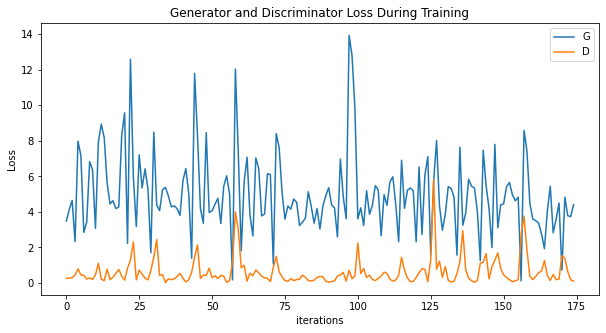

In [ ]:
#For a certain image
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_D_loss[0][0],label="G")
plt.plot(G_D_loss[0][1],label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Visualization of the Generator's progression

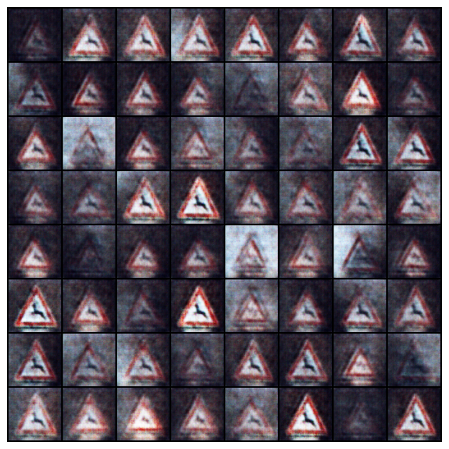

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())